# A tutorial using the human BMMC SHARE-seq data

first load all the relevant libraries

In [1]:
%load_ext autoreload
%autoreload 2
import scprinter as scp
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import time
import pandas as pd
import numpy as np
import os
import pickle
import torch
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42
from scanpy.plotting.palettes import zeileis_28
from tqdm.contrib.concurrent import *
from tqdm.auto import *
import anndata
import scanpy as sc
import json

define path to the relevant files, minimum files needed is just: 
- fragments
you can generate peaks using the scprinter package, but a pre-defined region would also work

If you will be using LoRA to infer single cell / pseudo-bulk level sequence features, also provide:
- grouping of the cells
- embeddings of the cells

In [3]:
work_dir = '/data/rzhang/PRINT_rev/BMMC_tutorial'
frag = f'{work_dir}/merged.fragments.tsv.gz'
peak = f'{work_dir}/regions.bed'
barcodegroups = pd.read_table(f'{work_dir}/barcodeGrouping.txt.gz')
groupinfo = pd.read_table(f'{work_dir}/groupInfo.txt')
embeddings = pd.read_csv(f'{work_dir}/cellEmbedding.tsv.gz', sep='\t')
cell_type = pd.read_csv(f'{work_dir}/celltype_info.tsv', sep='\t')

## Create scprinter & preprocessing

### Creating or load the scprinter object

scprinter object is the core object to do footprinting and train seq2print models

In [4]:
import scprinter as scp
import time
start = time.time()
if os.path.exists(f'{work_dir}/scprinter.h5ad'):
    printer = scp.load_printer(f'{work_dir}/scprinter.h5ad', scp.genome.hg38)
else:
    printer = scp.pp.import_fragments(
                        path_to_frags= frag,
                        barcodes=np.unique(barcodegroups['barcode']),
                        savename=f'{work_dir}/scprinter.h5ad',
                        genome=scp.genome.hg38,
                        min_num_fragments=0, min_tsse=0,
                        sorted_by_barcode=False, 
                        low_memory=False
                        )
print ("takes", time.time()-start)

single input
Detecting the shift in the paired end fragments file
If you think the above message is wrong, please check the input file format
Minimum MSE is 0.0013048379359375001, shift detected
Minimum MSE is 0.0012805450005125003, shift detected
You are now using the beta auto_detect_shift function, this overwrites the plus_shift and minus_shift you provided
If you believe the auto_detect_shift is wrong, please set auto_detect_shift=False
detected plus_shift and minus_shift are 4 -5 for /data/rzhang/PRINT_rev/BMMC_tutorial/merged.fragments.tsv.gz


IOStream.flush timed out


takes 2591.7895967960358


take a look at the barcodegroups, groupinfo, and embeddings

In [5]:
barcodegroups

,barcode,group
0,T128.R1.124.R2.026.R3.048.P1.02,1
1,T128.R1.037.R2.155.R3.075.P1.06,1
2,T128.R1.057.R2.043.R3.017.P1.03,1
3,T128.R1.001.R2.057.R3.120.P1.02,1
4,T128.R1.041.R2.077.R3.050.P1.08,1
...,...,...
4999995,T124.R1.109.R2.097.R3.143.P1.04,1000
4999996,T128.R1.069.R2.095.R3.157.P1.03,1000
4999997,T128.R1.065.R2.068.R3.190.P1.01,1000
4999998,T128.R1.059.R2.126.R3.101.P1.02,1000


In [6]:
groupinfo

,groupID,cellType,UMAP1,UMAP2,Pseudotime,color,MyeloidProbs,ErythroidProbs,BLymphoidProbs,TLymphoidProbs
0,1,CD4,9.001021,0.096889,0.977142,#005F9F,0.00000,0.0,0.0,0.998463
1,2,CD16mono,-8.828829,5.639757,0.367753,#F26625,0.99921,0.0,0.0,0.000000
2,3,CD14mono,-9.002045,2.610761,0.373777,#F28238,0.99923,0.0,0.0,0.000000
3,4,late-Ery,-8.157805,-10.942774,0.905431,#901838,0.00000,1.0,0.0,0.000000
4,5,NK,3.967188,-6.635262,0.989003,#492264,0.00000,0.0,0.0,0.999085
...,...,...,...,...,...,...,...,...,...,...
995,996,late-Ery,-8.127533,-10.584183,0.895157,#901838,0.00000,1.0,0.0,0.000000
996,997,late-Ery,-7.567782,-10.629585,0.874019,#901838,0.00000,1.0,0.0,0.000000
997,998,NK,2.886501,-8.023002,0.996672,#492264,0.00000,0.0,0.0,0.999327
998,999,CD8,3.166318,-3.892827,0.984040,#1481C4,0.00000,0.0,0.0,0.998780


In [7]:
embeddings

,Topic1,Topic2,Topic3,Topic4,Topic5,Topic6,Topic7,Topic8,Topic9,Topic10,...,Topic41,Topic42,Topic43,Topic44,Topic45,Topic46,Topic47,Topic48,Topic49,Topic50
T128.R1.001.R2.001.R3.003.P1.02,-0.110008,-0.208111,-0.338180,-0.299601,-0.373453,-0.306214,-0.247793,-0.298498,-0.375658,-0.026234,...,-0.258816,0.162256,-0.284169,-0.313930,-0.173940,-0.392192,-0.404317,0.809296,0.076278,-0.216929
T128.R1.001.R2.001.R3.010.P1.07,-0.320028,1.913385,0.307589,0.986094,6.012688,-0.235215,-0.693206,-0.342645,-0.693206,-0.206944,...,-0.088206,1.003057,-0.348299,-0.585776,0.861702,-0.014701,-0.557505,-0.144748,-0.031664,-0.297411
T128.R1.001.R2.001.R3.025.P1.06,-0.273118,-0.237437,-0.460440,-0.539910,-0.403676,-0.556128,-0.548830,-0.307176,-0.438545,-0.272307,...,0.537802,0.049628,-0.122287,0.112880,-0.528557,-0.391512,-0.560183,0.416975,3.497656,-0.519637
T128.R1.001.R2.001.R3.030.P1.06,-0.084996,0.308291,-0.159908,0.403372,-0.188720,0.424981,-0.443709,-0.426422,-0.322698,0.380322,...,-0.422100,0.776491,-0.306851,-0.360154,-0.321257,-0.494131,6.442426,-0.302529,0.351510,-0.242023
T128.R1.001.R2.001.R3.061.P1.01,-0.619642,0.856951,1.226100,0.817400,0.408700,0.962422,-0.593274,0.540539,-0.791032,-0.421884,...,-0.672377,0.355964,-0.474619,-0.883319,0.303229,0.303229,-0.883319,-0.131839,-0.250493,-0.659193
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
T124.R1.192.R2.191.R3.121.P1.04,-0.084447,0.660023,0.915587,0.671134,5.410187,0.210007,-0.773360,-0.656689,-0.467794,-0.428904,...,-0.751137,-0.362235,-0.317789,-0.790027,0.848918,-0.701135,-0.801139,-0.428904,-0.556686,-0.290010
T124.R1.192.R2.191.R3.135.P1.04,-0.424785,-0.288770,-0.006278,-0.492793,-0.396013,-0.547722,-0.709894,-0.262614,-0.707278,-0.241688,...,-0.212916,-0.453558,0.969369,-0.362009,-0.602651,0.304988,-0.717741,-0.126599,-0.257382,-0.273076
T124.R1.192.R2.192.R3.001.P1.04,0.020501,1.660572,-0.087698,-0.233862,5.903118,-0.273725,-0.467344,-0.465446,-0.512902,-0.292707,...,-0.381924,-0.381924,-0.531884,-0.355349,1.540984,-0.406601,-0.537579,-0.212981,-0.083902,0.436213
T124.R1.192.R2.192.R3.033.P1.04,-0.716842,0.167509,-0.096072,0.322702,-0.064048,-0.460651,-0.948399,0.278361,-0.763646,-0.485285,...,-0.573966,-0.219240,-0.455724,-0.736549,-0.332555,-0.401530,-0.716842,0.113315,0.867108,-0.426164


In [8]:
# It requires printer because it will map barcode names to the index in the insertion sparse matrix
grouping, uniq_groups = scp.utils.df2cell_grouping(printer, barcodegroups)

In [9]:
ids = [5,9,13,17,20,29,33,37,50,58,66,69,74,88,91,98,99,100,110,114,115,120,122,125,138,147,165,189,196,205,221,225,241,244,246,250,256,262,263,264,265,281,289,299,300,313,324,328,334,335,384,386,391,396,404,414,416,423,426,427,436,439,454,473,474,478,482,484,488,489,520,522,541,544,546,601,620,632,636,638,643,657,664,673,696,698,701,705,707,715,721,741,747,753,756,767,784,803,805,807,811,828,834,837,853,859,879,880,894,896,897,898,910,911,921,944,949,959,978,981,982,995,998,1000,1,10,14,19,26,32,71,75,179,180,181,186,193,194,198,200,206,208,211,224,230,232,239,242,247,252,259,260,261,270,275,282,292,297,298,304,305,323,325,326,327,333,337,338,342,345,355,365,374,375,380,381,395,405,410,413,420,465,476,493,510,511,517,529,538,542,543,552,567,586,593,599,602,615,644,652,658,666,669,686,702,710,713,714,719,726,727,744,745,748,750,765,771,778,792,821,833,841,848,849,865,867,882,885,893,902,932,935,939,942,954,955,962,965,966,975,976,8,12,15,23,35,40,46,57,65,70,82,85,86,89,101,113,140,149,154,176,183,199,214,222,237,238,251,257,268,277,303,309,310,361,363,368,377,389,400,401,415,417,425,438,442,451,459,466,471,472,494,496,502,504,508,514,518,528,564,592,600,624,651,660,663,671,693,711,720,725,732,734,735,736,758,781,783,799,822,830,840,854,862,864,872,875,889,912,919,920,945,951,952,958,969,970,972,977,979,980,986,991,992,999,330,344,366,398,429,462,483,628,665,694,708,737,780,794,824,866,947,144,430,540,699,112,162,435,441,530,587,746,800,953,18,168,388,437,453,532,582,856,956,129,226,294,308,434,503,560,588,596,625,728,768,782,838,878,16,22,44,45,54,56,60,81,84,93,126,130,134,139,142,156,170,192,201,204,217,253,269,352,354,392,394,445,452,455,464,467,576,581,607,681,704,706,723,739,751,766,806,835,863,871,892,895,901,923,924,946,4,42,59,63,109,111,141,143,184,197,209,213,231,283,302,306,316,343,358,360,372,383,403,408,440,447,460,469,533,548,555,570,583,585,595,606,610,611,618,637,662,684,697,700,718,761,777,789,808,810,816,818,839,845,850,876,899,906,913,929,974,985,987,996,997,30,34,64,97,124,171,190,218,279,329,443,461,485,575,594,621,646,692,733,738,770,773,801,829,831,836,844,860,881,883,886,904,909,933,973,2,41,53,73,96,105,128,161,175,178,210,271,320,322,359,367,406,458,463,470,479,506,513,523,561,566,603,634,635,648,674,688,755,787,827,842,858,873,927,937,943,3,6,21,31,39,43,47,48,51,52,68,76,80,90,103,106,107,116,137,148,150,151,153,158,160,173,182,185,188,202,203,207,212,220,223,229,236,240,243,248,255,266,272,274,276,280,284,285,286,288,291,295,312,314,315,317,318,331,332,339,340,348,353,356,357,362,364,369,376,378,379,397,402,411,412,418,422,432,450,457,475,481,487,492,498,501,507,516,519,521,526,531,545,550,553,554,559,562,563,568,574,590,591,597,605,608,613,614,616,619,626,627,629,639,641,649,650,659,667,668,670,672,676,679,683,685,689,695,703,709,717,722,724,729,740,742,743,752,754,757,759,762,769,774,775,788,795,797,802,804,817,819,820,823,826,846,847,852,855,861,868,870,877,884,891,900,905,915,917,918,922,931,936,938,948,960,964,967,968,971,984,993,49,67,78,79,87,159,187,191,219,346,419,468,480,490,578,598,630,642,654,682,716,764,772,790,812,815,874,930,934,940,94,102,131,155,301,321,524,551,558,832,961,990,350,534,760,925,7,11,24,28,38,61,83,92,95,117,118,119,127,132,133,146,152,157,163,164,166,167,172,174,195,216,227,233,245,249,254,267,273,278,287,296,307,336,341,347,349,351,370,371,385,390,393,407,409,424,428,431,444,449,456,477,491,495,497,499,500,505,509,515,527,537,539,571,572,577,579,580,584,612,617,623,631,633,645,653,655,656,677,690,712,730,749,763,779,785,786,791,798,813,843,851,857,887,888,908,926,928,957,963,983,989,77,108,136,145,293,311,421,525,556,565,622,691,25,36,62,121,123,169,177,228,234,235,290,373,382,387,446,448,569,589,604,640,647,661,675,678,776,796,809,869,903,950,27,55,72,104,135,215,258,319,399,433,486,512,535,536,547,549,557,573,609,680,687,731,793,814,825,890,907,914,916,941,988,994]
ids = np.array(ids) - 1
grouping = np.array(grouping)[ids]
uniq_groups = np.array(uniq_groups)[ids]

### call peaks on the fragments in a preset for training seq2PRINT model

Use all barcodes presented, and call peaks. Use the preset "seq2PRINT" to generate peaks that is appropriate to train a seq2PRINT model on.
It is recommended to do this, instead of using your predefined peak region to train seq2PRINT

In [ ]:
scp.pp.call_peaks(printer=printer, 
                  frag_file=frag,
                  cell_grouping=[list(printer.obs_names)], # here we call peaks on the cells that are included in the final analyses
                  group_names=['all'], 
                  preset='seq2PRINT')

In [9]:
# fetched the cleaned peaks, save, it will be used in the next step
cleaned_peaks = pd.DataFrame(printer.uns["peak_calling"]['all_cleaned'][:])
cleaned_peaks.to_csv(f'{work_dir}/seq2print_cleaned_narrowPeak.bed', 
                     sep='\t', header=False, index=False)

cleaned_peaks

,0,1,2,3,4,5,6,7
0,chr1,816837,817837,all_peak_7,1455.05,1455.05,all,23591
1,chr1,825289,826289,all_peak_8,2.62458,2.62458,all,256539
2,chr1,827024,828024,all_peak_9,8861.23,8861.23,all,7168
3,chr1,828857,829857,all_peak_10a,34.2292,34.2292,all,133053
4,chr1,829685,830685,all_peak_10b,4.63524,4.63524,all,230125
...,...,...,...,...,...,...,...,...
267028,chrX,155611170,155612170,all_peak_141298b,191.643,191.643,all,71515
267029,chrX,155612355,155613355,all_peak_141298c,1855.33,1855.33,all,20021
267030,chrX,155632167,155633167,all_peak_141299,300.122,300.122,all,58695
267031,chrX,155641003,155642003,all_peak_141300,2.08109,2.08109,all,265737


## Training and analyses regarding seq2PRINT trained on the pseudobulk of all cells

### Generate the configuration files

Here let's train a bulk model that uses cells of all cell type , we use the default parameters for seq2PRINT. Note that you can change the cell_grouping etc to create a cell type specific model easily.

In [10]:
import json
model_configs = []
if not os.path.exists(os.path.join(work_dir, 'configs')):
    os.makedirs(os.path.join(work_dir, 'configs'))
for fold in range(5):
    model_config= scp.tl.seq_model_config(printer, 
                                     region_path=f'{work_dir}/seq2print_cleaned_narrowPeak.bed',
                                     cell_grouping=printer.obs_names,
                                     group_names='BMMC_Bulk',
                                     genome=printer.genome,
                                     fold=fold,
                                     overwrite_bigwig=False,
                                     model_name='BMMC_Bulk',
                                     additional_config={
                                        "notes": "v3",
                                        "tags": ["BMMC",
                                            "Bulk",
                                            f"fold{fold}"]},
                                     path_swap=(work_dir, ''),
                                     config_save_path=f'{work_dir}/configs/BMMC_fold{fold}.JSON')
    model_configs.append(model_config)

Loading insertion profiles
Creating bigwig for BMMC_Bulk


  0%|          | 0/24 [00:00<?, ?it/s]

bigwig for BMMC_Bulk already exists, skip
bigwig for BMMC_Bulk already exists, skip
bigwig for BMMC_Bulk already exists, skip
bigwig for BMMC_Bulk already exists, skip


### launch the training script

In [14]:
for path in ['temp','model']:
    if not os.path.exists(os.path.join(work_dir, path)):
        os.makedirs(os.path.join(work_dir, path))
        
for fold in range(5):
    scp.tl.launch_seq2print(model_config_path=f'{work_dir}/configs/BMMC_fold{fold}.JSON',
                            temp_dir='../PRINT_rev/BMMC_tutorial/temp',
                            model_dir='../PRINT_rev/BMMC_tutorial/model',
                            data_dir='../PRINT_rev/BMMC_tutorial',
                            gpus=fold,
                            wandb_project='scPrinter_seq_tutorial', # wandb helps you manage loggins
                            verbose=True, 
                            launch=False # launch=True, this command would launch the scripts directly, 
                            # otherwise, it will just display the commands, you should copy them and run them.
                           )

Please copy the following command in your terminal and run it to start the job
CUDA_VISIBLE_DEVICES=0 seq2print_train --config /data/rzhang/PRINT_rev/BMMC_tutorial/configs/BMMC_fold0.JSON --temp_dir ../PRINT_rev/BMMC_tutorial/temp --model_dir ../PRINT_rev/BMMC_tutorial/model --data_dir ../PRINT_rev/BMMC_tutorial --project scPrinter_seq_tutorial --enable_wandb
Please copy the following command in your terminal and run it to start the job
CUDA_VISIBLE_DEVICES=1 seq2print_train --config /data/rzhang/PRINT_rev/BMMC_tutorial/configs/BMMC_fold1.JSON --temp_dir ../PRINT_rev/BMMC_tutorial/temp --model_dir ../PRINT_rev/BMMC_tutorial/model --data_dir ../PRINT_rev/BMMC_tutorial --project scPrinter_seq_tutorial --enable_wandb
Please copy the following command in your terminal and run it to start the job
CUDA_VISIBLE_DEVICES=2 seq2print_train --config /data/rzhang/PRINT_rev/BMMC_tutorial/configs/BMMC_fold2.JSON --temp_dir ../PRINT_rev/BMMC_tutorial/temp --model_dir ../PRINT_rev/BMMC_tutorial/model 

### generate sequence attribution score

after locate the trained models, we can generate the sequence attribution scores for the count and footprint output of the seq2print model, and used it for downstream tasks

In [19]:
pretrain_models = ['BMMC_Bulk_fold0-apricot-dew-102.pt',
                  'BMMC_Bulk_fold1-misunderstood-resonance-101.pt',
                  'BMMC_Bulk_fold2-sweet-tree-105.pt',
                  'BMMC_Bulk_fold3-blooming-deluge-103.pt',
                  'BMMC_Bulk_fold4-worthy-pond-104.pt']
model_path = [os.path.join(work_dir, "model", m) for m in pretrain_models]

In [20]:
# This will generate the sequence attribution scores for the footprint, you can input multiple models, it will iterate over them
scp.tl.seq_attr_seq2print(
    genome=printer.genome,
    region_path=peak,
    model_type='seq2print',
    model_path=model_path,
    gpus=[0,1,2,3,4,5,6,7],
    preset='footprint',
    overwrite=False,
    verbose=True,
    launch=False)

Using preset, the following parameters would be overwritten
using wrapper: just_sum
using nth_output: 0-30
using decay: 0.85
Please copy the following command in your terminal and run it to start the job
seq2print_attr --pt /data/rzhang/PRINT_rev/BMMC_tutorial/model/BMMC_Bulk_fold0-apricot-dew-102.pt --peaks /data/rzhang/PRINT_rev/BMMC_tutorial/regions.bed --method shap_hypo --wrapper just_sum --nth_output 0-30 --gpus 0 1 2 3 4 5 6 7 --genome hg38 --decay 0.85 --save_key deepshap --model_norm footprint
Using preset, the following parameters would be overwritten
using wrapper: just_sum
using nth_output: 0-30
using decay: 0.85
Please copy the following command in your terminal and run it to start the job
seq2print_attr --pt /data/rzhang/PRINT_rev/BMMC_tutorial/model/BMMC_Bulk_fold1-misunderstood-resonance-101.pt --peaks /data/rzhang/PRINT_rev/BMMC_tutorial/regions.bed --method shap_hypo --wrapper just_sum --nth_output 0-30 --gpus 0 1 2 3 4 5 6 7 --genome hg38 --decay 0.85 --save_key deep

In [21]:
# This will generate the sequence attribution scores for the count head, you can input multiple models, it will iterate over them
scp.tl.seq_attr_seq2print(
    genome=printer.genome,
    region_path=peak,
    model_type='seq2print',
    model_path=model_path,
    gpus=[0,1,2,3,4,5,6,7],
    preset='count',
    overwrite=False,
    verbose=True,
    launch=False)

Using preset, the following parameters would be overwritten
using wrapper: count
using nth_output: 0
using decay: 0.85
Please copy the following command in your terminal and run it to start the job
seq2print_attr --pt /data/rzhang/PRINT_rev/BMMC_tutorial/model/BMMC_Bulk_fold0-apricot-dew-102.pt --peaks /data/rzhang/PRINT_rev/BMMC_tutorial/regions.bed --method shap_hypo --wrapper count --nth_output 0 --gpus 0 1 2 3 4 5 6 7 --genome hg38 --decay 0.85 --save_key deepshap --model_norm count
Using preset, the following parameters would be overwritten
using wrapper: count
using nth_output: 0
using decay: 0.85
Please copy the following command in your terminal and run it to start the job
seq2print_attr --pt /data/rzhang/PRINT_rev/BMMC_tutorial/model/BMMC_Bulk_fold1-misunderstood-resonance-101.pt --peaks /data/rzhang/PRINT_rev/BMMC_tutorial/regions.bed --method shap_hypo --wrapper count --nth_output 0 --gpus 0 1 2 3 4 5 6 7 --genome hg38 --decay 0.85 --save_key deepshap --model_norm count
Usin

### Call denovo motifs from the sequence attribution scores

In [30]:
if not os.path.exists(f'{work_dir}/modisco'):
    os.makedirs(f'{work_dir}/modisco')
scp.tl.seq_denovo_seq2print(model_path=model_path,
                            region_path=peak,
                            genome=printer.genome,
                            gpus=[0,1,2,3,4,5,6,7],
                            preset='footprint',
                            save_path=f'{work_dir}/modisco/modisco.footprint.h5',
                            verbose=True)


signal_window 1000 dna_len 1840
input summits 189259


validating loci:   0%|          | 0/189259 [00:00<?, ?it/s]

valid summits after trimming edges 189259


fetching coverage:   0%|          | 0/189259 [00:00<?, ?it/s]

(189259, 1)
coverage min max 627.5529 1330.0762
valid summits after min/max count filter 189259


Caching sequences:   0%|          | 0/189259 [00:00<?, ?it/s]

Please copy the following command in your terminal and run it to start the job
modisco motifs -s /data/rzhang/PRINT_rev/BMMC_tutorial/regions.bed_ohe.npz -a /data/rzhang/PRINT_rev/BMMC_tutorial/modisco/modisco.footprint.h5.avg.hypo.npz -n 1000000 -o /data/rzhang/PRINT_rev/BMMC_tutorial/modisco/modisco.footprint.h5 -w 1000


In [31]:
if not os.path.exists(f'{work_dir}/modisco'):
    os.makedirs(f'{work_dir}/modisco')
scp.tl.seq_denovo_seq2print(model_path=model_path,
                            region_path=peak,
                            genome=printer.genome,
                            gpus=[0,1,2,3,4,5,6,7],
                            preset='count',
                            save_path=f'{work_dir}/modisco/modisco.count.h5',
                            verbose=True)


Please copy the following command in your terminal and run it to start the job
modisco motifs -s /data/rzhang/PRINT_rev/BMMC_tutorial/regions.bed_ohe.npz -a /data/rzhang/PRINT_rev/BMMC_tutorial/modisco/modisco.count.h5.avg.hypo.npz -n 1000000 -o /data/rzhang/PRINT_rev/BMMC_tutorial/modisco/modisco.count.h5 -w 1000


### Generate the delta effects for those denovo motifs

In [52]:
de = scp.tl.delta_effects_seq2print(model_path,
                               genome=scp.genome.hg38,
                               region_path=peak,
                               motifs= f'{work_dir}/modisco/modisco.footprint.h5',
                               prefix='footprint',
                               device='cuda:4', # use the second gpu
                               sample_num=20000,
                               batch_size=512,
                               save_path=f'{work_dir}/modisco/delta_effects_footprint', 
                               plot=True, vmin='auto', vmax='auto')

motifs:   0%|          | 0/105 [00:00<?, ?it/s]

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


motifs:   0%|          | 0/105 [00:00<?, ?it/s]

motifs:   0%|          | 0/105 [00:00<?, ?it/s]

motifs:   0%|          | 0/105 [00:00<?, ?it/s]

motifs:   0%|          | 0/105 [00:00<?, ?it/s]

Using vmin/vmax: -0.08 0.08


In [66]:
de = scp.tl.delta_effects_seq2print(model_path,
                               genome=scp.genome.hg38,
                               region_path=peak,
                               motifs= f'{work_dir}/modisco/modisco.count.h5',
                               prefix='count',
                               device='cuda:4', # use the second gpu
                               sample_num=20000,
                               batch_size=512,
                               save_path=f'{work_dir}/modisco/delta_effects_count', 
                               plot=True, vmin='auto', vmax='auto')

motifs:   0%|          | 0/126 [00:00<?, ?it/s]

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


motifs:   0%|          | 0/126 [00:00<?, ?it/s]

motifs:   0%|          | 0/126 [00:00<?, ?it/s]

motifs:   0%|          | 0/126 [00:00<?, ?it/s]

motifs:   0%|          | 0/126 [00:00<?, ?it/s]

Using vmin/vmax: -0.09 0.09


### Create a report for these denovo motifs (match to known cisBP ones + delta effects)

In [71]:
scp.tl.modisco_report(modisco_h5=f'{work_dir}/modisco/modisco.footprint.h5',
                     save_path=f'{work_dir}/modisco_footprint',
                     meme_motif=scp.datasets.FigR_motifs_mouse_meme,
                     is_writing_tomtom_matrix=False,
                     top_n_matches=3,
                     delta_effect_path=f'{work_dir}/modisco/delta_effects_footprint', 
                     delta_effect_prefix='footprint')

In [72]:
scp.tl.modisco_report(modisco_h5=f'{work_dir}/modisco/modisco.count.h5',
                     save_path=f'{work_dir}/modisco_count',
                     meme_motif=scp.datasets.FigR_motifs_mouse_meme,
                     is_writing_tomtom_matrix=False,
                     top_n_matches=3,
                     delta_effect_path=f'{work_dir}/modisco/delta_effects_count', 
                     delta_effect_prefix='count')

### We can do chromvar on both the cisBP motifs, and the de-novo motifs

first create a cellx peak anndata

In [19]:
adata = scp.pp.make_peak_matrix(printer,
                       regions=peak,
                       region_width=300,
                       cell_grouping=None,
                       group_names=None,
                       sparse=True)

Making peak matrix:   0%|          | 0/189259 [00:00<?, ?it/s]

In [20]:
adata.write(f'{work_dir}/cell_peak.h5ad')

Let's first do the chromvar on cisBP motifs

In [5]:
import scanpy as sc
import anndata
import cupy as cp
import cupyx as cpx
import time

import warnings
warnings.filterwarnings("ignore")
import rmm
from rmm.allocators.cupy import rmm_cupy_allocator
rmm.reinitialize(
    managed_memory=True, # Allows oversubscription
    pool_allocator=True, # default is False
    devices=0, # GPU device IDs to register. By default registers only GPU 0.
)

cp.cuda.set_allocator(rmm_cupy_allocator)

In [6]:
adata = anndata.read_h5ad(f'{work_dir}/cell_peak.h5ad')
coverage = adata.X.sum(axis=0)
adata = adata[:, coverage > 0]
adata

View of AnnData object with n_obs × n_vars = 833086 × 189258

In [6]:
scp.chromvar.sample_bg_peaks(adata, 
                             genome=scp.genome.hg38, 
                             method='chromvar', 
                             niterations=250)
motif = scp.motifs.FigR_Human_Motifs(scp.genome.hg38,
                                     bg=list(adata.uns['bg_freq']), 
                                     n_jobs=100,
                                     pvalue=5e-5, mode='motifmatchr')
motif.prep_scanner(
    None,
    pvalue=5e-5,
)
motif.chromvar_scan(adata)

Fetching GC content:   0%|          | 0/189258 [00:00<?, ?it/s]

Sampling nearest neighbors
NNDescent (2500, 2)


Sampling background peaks:   0%|          | 0/2500 [00:00<?, ?it/s]

  0%|          | 0/378516 [00:00<?, ?it/s]

In [7]:
chromvar = scp.chromvar.compute_deviations(adata, chunk_size=50000, device='cuda')

Computing expectation reads per cell and peak...


Processing chunks:   0%|          | 0/17 [00:00<?, ?it/s]

Processing background peaks:   0%|          | 0/250 [00:00<?, ?it/s]

Processing background peaks:   0%|          | 0/250 [00:00<?, ?it/s]

Processing background peaks:   0%|          | 0/250 [00:00<?, ?it/s]

Processing background peaks:   0%|          | 0/250 [00:00<?, ?it/s]

Processing background peaks:   0%|          | 0/250 [00:00<?, ?it/s]

Processing background peaks:   0%|          | 0/250 [00:00<?, ?it/s]

Processing background peaks:   0%|          | 0/250 [00:00<?, ?it/s]

Processing background peaks:   0%|          | 0/250 [00:00<?, ?it/s]

Processing background peaks:   0%|          | 0/250 [00:00<?, ?it/s]

Processing background peaks:   0%|          | 0/250 [00:00<?, ?it/s]

Processing background peaks:   0%|          | 0/250 [00:00<?, ?it/s]

Processing background peaks:   0%|          | 0/250 [00:00<?, ?it/s]

Processing background peaks:   0%|          | 0/250 [00:00<?, ?it/s]

Processing background peaks:   0%|          | 0/250 [00:00<?, ?it/s]

Processing background peaks:   0%|          | 0/250 [00:00<?, ?it/s]

Processing background peaks:   0%|          | 0/250 [00:00<?, ?it/s]

Processing background peaks:   0%|          | 0/250 [00:00<?, ?it/s]

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [8]:
chromvar.write(f'{work_dir}/chromvar_cisbp.h5ad')
# Now let's visualize the chromvar score in the UMAP space

In [96]:
chromvar = anndata.read_h5ad(f'{work_dir}/chromvar_cisbp.h5ad')

In [103]:
from cuml import UMAP
vec = UMAP(metric='cosine').fit_transform(embeddings.loc[chromvar.obs.index].values)
chromvar.obsm['X_umap'] = vec
chromvar.obs = cell_type.loc[chromvar.obs.index].copy()

The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


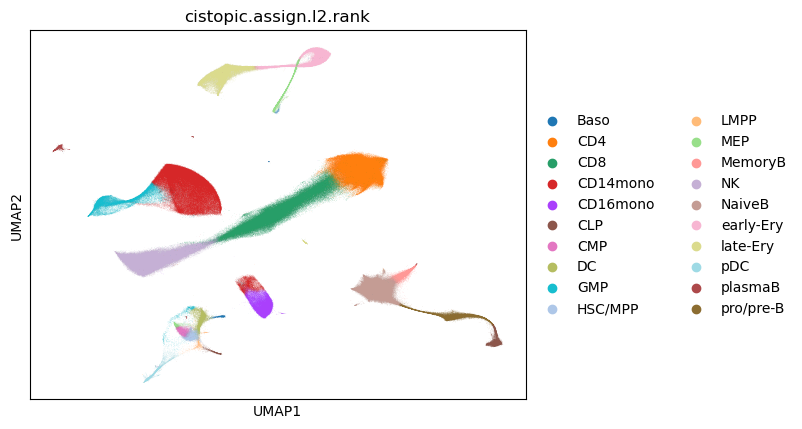

In [108]:
sc.pl.umap(chromvar, color=['cistopic.assign.l2.rank'])


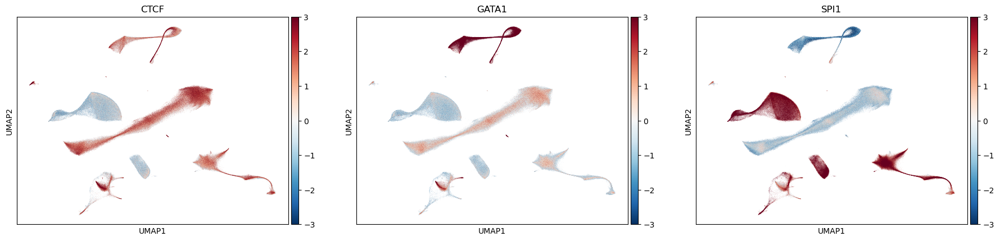

In [110]:
sc.pl.umap(chromvar, color=['CTCF', 'GATA1','SPI1'],cmap='RdBu_r',vmin=-3, vmax=3)


Now for denovo, first call hits (similar to a motif matching)

In [113]:
hits_footprint = scp.tl.seq_denovo_callhits(modisco_output=f'{work_dir}/modisco/modisco.footprint.h5',
                           model_path=model_path,
                           region_path=peak,
                           device='cuda:0',
                           preset='footprint',
                           save_path=f'{work_dir}/modisco/finemo_footprint',
                           overwrite=False,
                           verbose=True,
                           launch=True, # Usually should be True when return_hits=True, but I run it once already
                           return_hits=True)

In [114]:
hits_count = scp.tl.seq_denovo_callhits(modisco_output=f'{work_dir}/modisco/modisco.count.h5',
                           model_path=model_path,
                           region_path=peak,
                           device='cuda:0',
                           preset='count',
                           save_path=f'{work_dir}/modisco/finemo_count',
                           overwrite=False,
                           verbose=True,
                           launch=True,
                           return_hits=True)

Let's take the footprint de-novo motifs as an example

In [134]:
adata = anndata.read_h5ad(f'{work_dir}/cell_peak.h5ad')
# This takes the hits_tsv, and create the motif matching data matrix and motif_name list that chromvar needs
motif_uniq = np.sort(hits_footprint['motif_name'].unique())
motif2id = {m:i for i,m in enumerate(motif_uniq)}
ids = [motif2id[m] for m in hits_footprint['motif_name']]
match_mm = np.zeros((adata.shape[1], len(motif_uniq)))
match_mm[hits_footprint['peak_id'], ids] += 1
match_mm
adata.varm['motif_match'] = match_mm
motif_uniq = [f'footprint_{xx}' for xx in motif_uniq]
adata.uns['motif_name'] = motif_uniq
# Filter after putting in motif match, because, we use all peaks above to call hits
coverage = adata.X.sum(axis=0)
adata = adata[:, coverage > 0]
adata

View of AnnData object with n_obs × n_vars = 833086 × 189258
    uns: 'motif_name'
    varm: 'motif_match'

In [135]:
scp.chromvar.sample_bg_peaks(adata, 
                             genome=scp.genome.hg38, 
                             method='chromvar', 
                             niterations=250)

Fetching GC content:   0%|          | 0/189258 [00:00<?, ?it/s]

Sampling nearest neighbors
NNDescent (2500, 2)


Sampling background peaks:   0%|          | 0/2500 [00:00<?, ?it/s]

array([[ 69490, 173323, 183040, ..., 144711,  81993,  84235],
       [171141, 114331, 139311, ..., 106010, 144677, 153693],
       [ 72558, 155199,  95933, ...,  46145, 176061,   7671],
       ...,
       [157496,  16986, 185852, ..., 147205, 103985, 116210],
       [  9408,  92846, 129160, ..., 116386,  38843,  71779],
       [144126, 173362,   6615, ...,  46828,  17930,  61221]])

In [136]:
chromvar_denovo = scp.chromvar.compute_deviations(adata, chunk_size=50000, device='cuda')

Computing expectation reads per cell and peak...


Processing chunks:   0%|          | 0/17 [00:00<?, ?it/s]

Processing background peaks:   0%|          | 0/250 [00:00<?, ?it/s]

Processing background peaks:   0%|          | 0/250 [00:00<?, ?it/s]

Processing background peaks:   0%|          | 0/250 [00:00<?, ?it/s]

Processing background peaks:   0%|          | 0/250 [00:00<?, ?it/s]

Processing background peaks:   0%|          | 0/250 [00:00<?, ?it/s]

Processing background peaks:   0%|          | 0/250 [00:00<?, ?it/s]

Processing background peaks:   0%|          | 0/250 [00:00<?, ?it/s]

Processing background peaks:   0%|          | 0/250 [00:00<?, ?it/s]

Processing background peaks:   0%|          | 0/250 [00:00<?, ?it/s]

Processing background peaks:   0%|          | 0/250 [00:00<?, ?it/s]

Processing background peaks:   0%|          | 0/250 [00:00<?, ?it/s]

Processing background peaks:   0%|          | 0/250 [00:00<?, ?it/s]

Processing background peaks:   0%|          | 0/250 [00:00<?, ?it/s]

Processing background peaks:   0%|          | 0/250 [00:00<?, ?it/s]

Processing background peaks:   0%|          | 0/250 [00:00<?, ?it/s]

Processing background peaks:   0%|          | 0/250 [00:00<?, ?it/s]

Processing background peaks:   0%|          | 0/250 [00:00<?, ?it/s]

In [141]:
chromvar_denovo.obsm['X_umap'] = vec
chromvar_denovo.obs = cell_type.loc[chromvar.obs.index].copy()

... storing 'sample' as categorical
... storing 'Type' as categorical
... storing 'donor' as categorical
... storing 'cistopic.assign.hg19' as categorical
... storing 'doublet' as categorical
... storing 'cistopic.assign' as categorical
... storing 'cistopic.assign.rank' as categorical
... storing 'cistopic.assign.l2.color' as categorical
... storing 'cistopic.assign.l2' as categorical
... storing 'cistopic.assign.l2.rank' as categorical


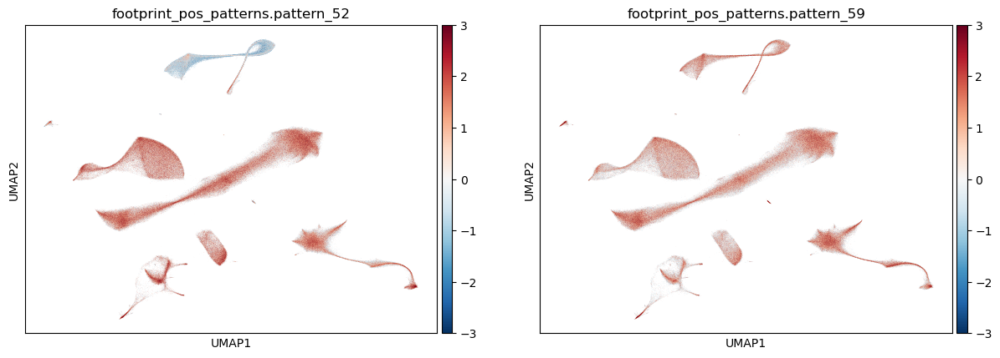

In [143]:
# Based on what's in the modisco report pdf, find interesting ones
sc.pl.umap(chromvar_denovo, color=['footprint_pos_patterns.pattern_52',
                           'footprint_pos_patterns.pattern_59'],cmap='RdBu_r',vmin=-3, vmax=3)


In [145]:
# or find the denovo motifs with high variabilities
var = np.std(chromvar_denovo.X, axis=0)
chromvar_denovo.var.index[np.argsort(var)[::-1][:5]]

Index(['footprint_pos_patterns.pattern_7', 'footprint_pos_patterns.pattern_2',
       'footprint_pos_patterns.pattern_0', 'footprint_pos_patterns.pattern_8',
       'footprint_pos_patterns.pattern_10'],
      dtype='object')

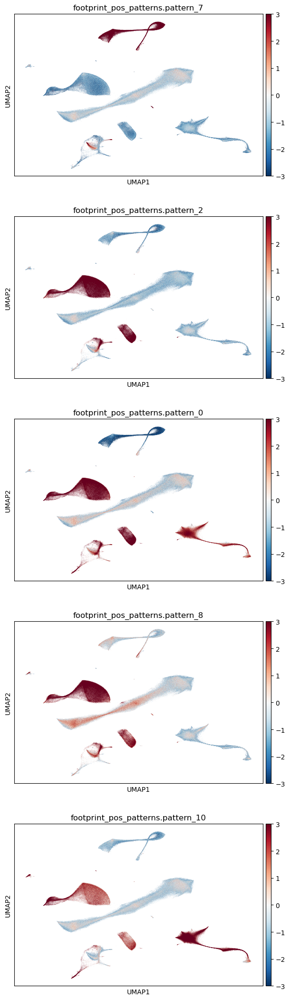

In [146]:
# Based on what's in the modisco report pdf, find interesting ones
sc.pl.umap(chromvar_denovo, color=chromvar_denovo.var.index[np.argsort(var)[::-1][:5]],
           cmap='RdBu_r',vmin=-3, vmax=3, ncols=1)


## Using the cell embeddings for LoRA fintune seq2PRINT models

### Train the LoRA models

You need to locate the trained models, either from wandb or inspecting the local file paths

In [10]:
# If you do over wandb, you can do this:
# Now fetch models:
import wandb

# Login to your W&B account
wandb.login()

# Set your entity and project
entity = 'ruochiz'  # Replace with your W&B entity (username or team name)
project = 'scPrinter_seq_tutorial'  # Replace with your W&B project name

# Initialize the API
api = wandb.Api()

# Get the project
runs = api.runs(f"{entity}/{project}")
condition2model = {}
for run in runs:
    print (run.name, run.tags)

wandb: Currently logged in as: ruochiz (yanhu0196-harvard-university). Use `wandb login --relogin` to force relogin


major-tree-318 ['OrganoidT5224', 'T5224_S10', 'fold3']
dulcet-deluge-319 ['OrganoidT5224', 'T5224_S10', 'fold4']
eager-frost-317 ['OrganoidT5224', 'T5224_S10', 'fold2']
serene-flower-316 ['OrganoidT5224', 'T5224_S10', 'fold1']
hearty-field-315 ['OrganoidT5224', 'T5224_S10', 'fold0']
wise-jazz-314 ['OrganoidT5224', 'T5224_S8', 'fold4']
restful-energy-312 ['DMSO_S9', 'OrganoidT5224', 'fold1']
driven-pond-312 ['DMSO_S9', 'OrganoidT5224', 'fold2']
faithful-puddle-311 ['DMSO_S9', 'OrganoidT5224', 'fold0']
restful-darkness-310 ['OrganoidT5224', 'T5224_S8', 'fold3']
royal-meadow-309 ['DMSO_S9', 'OrganoidT5224', 'fold4']
rose-sea-308 ['DMSO_S9', 'OrganoidT5224', 'fold3']
quiet-leaf-305 ['DMSO_S9', 'OrganoidT5224', 'fold1']
peachy-firebrand-304 ['OrganoidT5224', 'T5224_S8', 'fold4']
golden-frost-303 ['DMSO_S9', 'OrganoidT5224', 'fold2']
dandy-bee-305 ['DMSO_S9', 'OrganoidT5224', 'fold0']
iconic-valley-307 ['OrganoidT5224', 'T5224_S8', 'fold3']
usual-waterfall-299 ['DMSO_S7', 'OrganoidT5224', 'f

In [11]:
pretrain_models = ['BMMC_Bulk_fold0-apricot-dew-102.pt',
                  'BMMC_Bulk_fold1-misunderstood-resonance-101.pt',
                  'BMMC_Bulk_fold2-sweet-tree-105.pt',
                  'BMMC_Bulk_fold3-blooming-deluge-103.pt',
                  'BMMC_Bulk_fold4-worthy-pond-104.pt']

In [12]:
cell_grouping, group_names = scp.utils.df2cell_grouping(printer, barcodegroups)

We use single cell embeddings as well as some group specific meta data such as 'Pseudotime' as attribution to LoRA finetune the seq2PRINT models

In [13]:
lora_configs = []
for fold, model in enumerate(pretrain_models):
    lora_config = scp.tl.seq_lora_model_config(printer, 
                                            region_path=f'{work_dir}/seq2print_cleaned_narrowPeak.bed', 
                                            cell_grouping=cell_grouping,
                                            group_names=group_names,
                                            additional_group_attr=groupinfo[[
                                               'Pseudotime',
                                               'MyeloidProbs',
                                               'ErythroidProbs',
                                               'BLymphoidProbs', 
                                               'TLymphoidProbs'
                                            ]],
                                            embeddings=embeddings,
                                            genome=scp.genome.hg38,
                                            pretrain_model=f'{work_dir}/model/{model}',
                                            overwrite_barcode=False,
                                            model_name=f'BMMC_LoRA',
                                            fold=fold,
                                            model_config=f'{work_dir}/configs/BMMC_fold{fold}.JSON',
                                            additional_lora_config={
                                            "lr":3e-4, # put smaller lr for further fintune
                                            "notes": "v3",
                                            "tags": ["BMMC",
                                                     "Bulk",
                                                     "LoRA",
                                                f"fold{fold}"]},
                                            path_swap=(work_dir, ''),
                                               
                                            config_save_path=f'{work_dir}/configs/BMMC_lora_fold{fold}.JSON')
    lora_configs.append(lora_config)

launch the lora training process.
When set launch=True, the process would be launched directly, otherwise it would just print the command.
You'll need to copy the command and run it in the terminal yourself.|

In [18]:
for fold in range(5):
    scp.tl.launch_seq2print(model_config_path=f'{work_dir}/configs/BMMC_lora_fold{fold}.JSON',
                            temp_dir='../PRINT_rev/BMMC_tutorial/temp',
                            model_dir='../PRINT_rev/BMMC_tutorial/model',
                            data_dir='../PRINT_rev/BMMC_tutorial',
                            gpus=fold,
                            wandb_project='scPrinter_seq_tutorial', verbose=True, launch=False)

Please copy the following command in your terminal and run it to start the job
CUDA_VISIBLE_DEVICES=0 seq2print_train --config /data/rzhang/PRINT_rev/BMMC_tutorial/configs/BMMC_lora_fold0.JSON --temp_dir ../PRINT_rev/BMMC_tutorial/temp --model_dir ../PRINT_rev/BMMC_tutorial/model --data_dir ../PRINT_rev/BMMC_tutorial --project scPrinter_seq_tutorial --enable_wandb
Please copy the following command in your terminal and run it to start the job
CUDA_VISIBLE_DEVICES=1 seq2print_train --config /data/rzhang/PRINT_rev/BMMC_tutorial/configs/BMMC_lora_fold1.JSON --temp_dir ../PRINT_rev/BMMC_tutorial/temp --model_dir ../PRINT_rev/BMMC_tutorial/model --data_dir ../PRINT_rev/BMMC_tutorial --project scPrinter_seq_tutorial --enable_wandb
Please copy the following command in your terminal and run it to start the job
CUDA_VISIBLE_DEVICES=2 seq2print_train --config /data/rzhang/PRINT_rev/BMMC_tutorial/configs/BMMC_lora_fold2.JSON --temp_dir ../PRINT_rev/BMMC_tutorial/temp --model_dir ../PRINT_rev/BMMC_

### For the LoRA on 1000 pseudobulks, let's pick some interesting regions to visualize

Now, after the model is trained, we can use the trained LoRA model to interpret some region of interest to see their TF binding score pattern. (or sub-cCRE patterns. )

In [14]:
lora_models = ['BMMC_LoRA_fold0-honest-blaze-236.pt',
               'BMMC_LoRA_fold1-smooth-resonance-233.pt',
               'BMMC_LoRA_fold2-swift-darkness-237.pt',
               'BMMC_LoRA_fold3-glamorous-aardvark-234.pt',
               'BMMC_LoRA_fold4-faithful-field-235.pt'
              ]

regions = ['chr17:40330044-40330843',
'chr20:56411766-56412565',
'chr11:64810286-64811085',
'chr1:84690149-84690948',
'chr3:187739717-187740516',
'chr6:152982910-152983709'] # some interesting regions Yan picked up
regions += ['chr9:132977054-132978495',
'chr11:5280336-5281135',
'chr11:47359003-47360470',
'chr11:47377778-47379245',
'chr11:65661629-65663957',
'chr16:85898074-85899906',
'chr18:79465185-79466227',
'chr19:12994701-12996315',
'chr21:34887982-34889473',
'chr2:61425455-61427302',
'chr6:150682766-150684027',
'chr6:151690691-151691952',
'chr6:151947940-151949201']

regions += [
    'chr1:10917569-10918569',
    'chr1:43568844-43569844',
    'chr11:122856283-122857283',
    'chr1:4603084-4604084',
    'chr1:207362961-207363961',
    'chr6:20319517-20320517',
    'chr1:15965747-15966747',
    'chr8:68259891-68260891',
    'chr2:36441546-36442546',
    'chr8:120808916-120809916',
    'chr2:40455323-40456323',
    'chr13:86882437-86883437',
    'chr2:98026871-98027871',
    'chr3:8712243-8713243',
    'chr2:98663161-98664161',
    'chr3:71087045-71088045',
    'chr2:123738294-123739294',
    'chr3:141949143-141950143',
    'chr1:3890670-3891670',
    'chr4:113355358-113356358'
]

ids = [5,9,13,17,20,29,33,37,50,58,66,69,74,88,91,98,99,100,110,114,115,120,122,125,138,147,165,189,196,205,221,225,241,244,246,250,256,262,263,264,265,281,289,299,300,313,324,328,334,335,384,386,391,396,404,414,416,423,426,427,436,439,454,473,474,478,482,484,488,489,520,522,541,544,546,601,620,632,636,638,643,657,664,673,696,698,701,705,707,715,721,741,747,753,756,767,784,803,805,807,811,828,834,837,853,859,879,880,894,896,897,898,910,911,921,944,949,959,978,981,982,995,998,1000,1,10,14,19,26,32,71,75,179,180,181,186,193,194,198,200,206,208,211,224,230,232,239,242,247,252,259,260,261,270,275,282,292,297,298,304,305,323,325,326,327,333,337,338,342,345,355,365,374,375,380,381,395,405,410,413,420,465,476,493,510,511,517,529,538,542,543,552,567,586,593,599,602,615,644,652,658,666,669,686,702,710,713,714,719,726,727,744,745,748,750,765,771,778,792,821,833,841,848,849,865,867,882,885,893,902,932,935,939,942,954,955,962,965,966,975,976,8,12,15,23,35,40,46,57,65,70,82,85,86,89,101,113,140,149,154,176,183,199,214,222,237,238,251,257,268,277,303,309,310,361,363,368,377,389,400,401,415,417,425,438,442,451,459,466,471,472,494,496,502,504,508,514,518,528,564,592,600,624,651,660,663,671,693,711,720,725,732,734,735,736,758,781,783,799,822,830,840,854,862,864,872,875,889,912,919,920,945,951,952,958,969,970,972,977,979,980,986,991,992,999,330,344,366,398,429,462,483,628,665,694,708,737,780,794,824,866,947,144,430,540,699,112,162,435,441,530,587,746,800,953,18,168,388,437,453,532,582,856,956,129,226,294,308,434,503,560,588,596,625,728,768,782,838,878,16,22,44,45,54,56,60,81,84,93,126,130,134,139,142,156,170,192,201,204,217,253,269,352,354,392,394,445,452,455,464,467,576,581,607,681,704,706,723,739,751,766,806,835,863,871,892,895,901,923,924,946,4,42,59,63,109,111,141,143,184,197,209,213,231,283,302,306,316,343,358,360,372,383,403,408,440,447,460,469,533,548,555,570,583,585,595,606,610,611,618,637,662,684,697,700,718,761,777,789,808,810,816,818,839,845,850,876,899,906,913,929,974,985,987,996,997,30,34,64,97,124,171,190,218,279,329,443,461,485,575,594,621,646,692,733,738,770,773,801,829,831,836,844,860,881,883,886,904,909,933,973,2,41,53,73,96,105,128,161,175,178,210,271,320,322,359,367,406,458,463,470,479,506,513,523,561,566,603,634,635,648,674,688,755,787,827,842,858,873,927,937,943,3,6,21,31,39,43,47,48,51,52,68,76,80,90,103,106,107,116,137,148,150,151,153,158,160,173,182,185,188,202,203,207,212,220,223,229,236,240,243,248,255,266,272,274,276,280,284,285,286,288,291,295,312,314,315,317,318,331,332,339,340,348,353,356,357,362,364,369,376,378,379,397,402,411,412,418,422,432,450,457,475,481,487,492,498,501,507,516,519,521,526,531,545,550,553,554,559,562,563,568,574,590,591,597,605,608,613,614,616,619,626,627,629,639,641,649,650,659,667,668,670,672,676,679,683,685,689,695,703,709,717,722,724,729,740,742,743,752,754,757,759,762,769,774,775,788,795,797,802,804,817,819,820,823,826,846,847,852,855,861,868,870,877,884,891,900,905,915,917,918,922,931,936,938,948,960,964,967,968,971,984,993,49,67,78,79,87,159,187,191,219,346,419,468,480,490,578,598,630,642,654,682,716,764,772,790,812,815,874,930,934,940,94,102,131,155,301,321,524,551,558,832,961,990,350,534,760,925,7,11,24,28,38,61,83,92,95,117,118,119,127,132,133,146,152,157,163,164,166,167,172,174,195,216,227,233,245,249,254,267,273,278,287,296,307,336,341,347,349,351,370,371,385,390,393,407,409,424,428,431,444,449,456,477,491,495,497,499,500,505,509,515,527,537,539,571,572,577,579,580,584,612,617,623,631,633,645,653,655,656,677,690,712,730,749,763,779,785,786,791,798,813,843,851,857,887,888,908,926,928,957,963,983,989,77,108,136,145,293,311,421,525,556,565,622,691,25,36,62,121,123,169,177,228,234,235,290,373,382,387,446,448,569,589,604,640,647,661,675,678,776,796,809,869,903,950,27,55,72,104,135,215,258,319,399,433,486,512,535,536,547,549,557,573,609,680,687,731,793,814,825,890,907,914,916,941,988,994]
ids = np.array(ids) - 1 # reorder the ids to group by cell types
regions = scp.utils.regionparser(regions)
regions = scp.utils.resize_bed_df(regions, 1000)
regions.to_csv(f'{work_dir}/example_region1.bed', sep='\t', index=False, header=False)

In [15]:
vs = scp.tl.seq_tfbs_seq2print(seq_attr_count=None,
                          seq_attr_footprint=None,
                          genome=printer.genome,
                          region_path=f'{work_dir}/example_region1.bed',
                          gpus=[1,2,3,5,6,7],
                          model_type='lora',
                          model_path=[os.path.join(work_dir, 'model', m) for m in lora_models],
                          lora_config=lora_config,
                          group_names=group_names,
                          verbose=False,
                          launch=True,
                          return_adata=True, # turn this as True
                          overwrite_seqattr=False,
                          save_key='BMMC_bulklora_example_region1', # and input a save_key 
                          save_path=work_dir)

seq2print_tfbs --count_pt /home/rzhang/.cache/scprinter/TFBS_0_conv_v2.pt --foot_pt /home/rzhang/.cache/scprinter/TFBS_1_conv_v2.pt --seq_count /data/rzhang/PRINT_rev/BMMC_tutorial/model/BMMC_LoRA_fold4-faithful-field-235.pt_BMMC_bulklora_example_region1/model_{lora_id}.attr.count.shap_hypo_0_.0.85.bigwig --seq_foot /data/rzhang/PRINT_rev/BMMC_tutorial/model/BMMC_LoRA_fold4-faithful-field-235.pt_BMMC_bulklora_example_region1/model_{lora_id}.attr.just_sum.shap_hypo_0-30_.0.85.bigwig --genome hg38 --peaks /data/rzhang/PRINT_rev/BMMC_tutorial/example_region1.bed --save_name /data/rzhang/PRINT_rev/BMMC_tutorial/1,/data/rzhang/PRINT_rev/BMMC_tutorial/2,/data/rzhang/PRINT_rev/BMMC_tutorial/3,/data/rzhang/PRINT_rev/BMMC_tutorial/4,/data/rzhang/PRINT_rev/BMMC_tutorial/5,/data/rzhang/PRINT_rev/BMMC_tutorial/6,/data/rzhang/PRINT_rev/BMMC_tutorial/7,/data/rzhang/PRINT_rev/BMMC_tutorial/8,/data/rzhang/PRINT_rev/BMMC_tutorial/9,/data/rzhang/PRINT_rev/BMMC_tutorial/10,/data/rzhang/PRINT_rev/BMMC_tut

  0%|          | 0/6513 [00:00<?, ?it/s][urlOpen] Couldn't open /data/rzhang/PRINT_rev/BMMC_tutorial/model/BMMC_LoRA_fold4-faithful-field-235.pt_BMMC_bulklora_example_region1/model_501.attr.count.shap_hypo_0_.0.85.bigwig for reading
[urlOpen] Couldn't open /data/rzhang/PRINT_rev/BMMC_tutorial/model/BMMC_LoRA_fold4-faithful-field-235.pt_BMMC_bulklora_example_region1/model_501.attr.count.shap_hypo_0_.0.85.bigwig for reading
[pyBwOpen] bw is NULL!
Traceback (most recent call last):
  File "/home/rzhang/miniforge3/envs/seq2print/bin/seq2print_tfbs", line 8, in <module>
    sys.exit(main())
             ^^^^^^
  File "/home/rzhang/miniforge3/envs/seq2print/lib/python3.11/site-packages/scprinter/seq/scripts/generate_TFBS_bigwig.py", line 293, in main
    for feats in reader:
  File "/home/rzhang/miniforge3/envs/seq2print/lib/python3.11/site-packages/scprinter/seq/scripts/generate_TFBS_bigwig.py", line 36, in bigwig_reader
    bw = [pyBigWig.open(i, "r") for i in bw]
         ^^^^^^^^^^^^^^^^

gpu 2
gpu 7
gpu 6
gpu 3
gpu 1


  0%|          | 0/6513 [00:00<?, ?it/s][urlOpen] Couldn't open /data/rzhang/PRINT_rev/BMMC_tutorial/model/BMMC_LoRA_fold4-faithful-field-235.pt_BMMC_bulklora_example_region1/model_167.attr.count.shap_hypo_0_.0.85.bigwig for reading
[urlOpen] Couldn't open /data/rzhang/PRINT_rev/BMMC_tutorial/model/BMMC_LoRA_fold4-faithful-field-235.pt_BMMC_bulklora_example_region1/model_167.attr.count.shap_hypo_0_.0.85.bigwig for reading
[pyBwOpen] bw is NULL!
Traceback (most recent call last):
  File "/home/rzhang/miniforge3/envs/seq2print/bin/seq2print_tfbs", line 8, in <module>
    sys.exit(main())
             ^^^^^^
  File "/home/rzhang/miniforge3/envs/seq2print/lib/python3.11/site-packages/scprinter/seq/scripts/generate_TFBS_bigwig.py", line 293, in main
    for feats in reader:
  File "/home/rzhang/miniforge3/envs/seq2print/lib/python3.11/site-packages/scprinter/seq/scripts/generate_TFBS_bigwig.py", line 36, in bigwig_reader
    bw = [pyBigWig.open(i, "r") for i in bw]
         ^^^^^^^^^^^^^^^^

['seq2print_tfbs', '--count_pt', '/home/rzhang/.cache/scprinter/TFBS_0_conv_v2.pt', '--foot_pt', '/home/rzhang/.cache/scprinter/TFBS_1_conv_v2.pt', '--seq_count', '/data/rzhang/PRINT_rev/BMMC_tutorial/model/BMMC_LoRA_fold4-faithful-field-235.pt_BMMC_bulklora_example_region1/model_{lora_id}.attr.count.shap_hypo_0_.0.85.bigwig', '--seq_foot', '/data/rzhang/PRINT_rev/BMMC_tutorial/model/BMMC_LoRA_fold4-faithful-field-235.pt_BMMC_bulklora_example_region1/model_{lora_id}.attr.just_sum.shap_hypo_0-30_.0.85.bigwig', '--genome', 'hg38', '--peaks', '/data/rzhang/PRINT_rev/BMMC_tutorial/example_region1.bed', '--gpus', '2', '--lora_ids', '167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,

Traceback (most recent call last):
  File "/home/rzhang/miniforge3/envs/seq2print/bin/seq2print_tfbs", line 8, in <module>
    sys.exit(main())
             ^^^^^^
  File "/home/rzhang/miniforge3/envs/seq2print/lib/python3.11/site-packages/scprinter/seq/scripts/generate_TFBS_bigwig.py", line 246, in main
    results.append(np.load(f"{collection_name}_temp_TFBS_part{i}_TFBS.npz")["tfbs"])
                   ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/rzhang/miniforge3/envs/seq2print/lib/python3.11/site-packages/numpy/lib/npyio.py", line 427, in load
    fid = stack.enter_context(open(os_fspath(file), "rb"))
                              ^^^^^^^^^^^^^^^^^^^^^^^^^^^
FileNotFoundError: [Errno 2] No such file or directory: '/data/rzhang/PRINT_rev/BMMC_tutorial/BMMC_bulklora_example_region1_temp_TFBS_part0_TFBS.npz'


obs=groups, var=regions
AnnData object with n_obs × n_vars = 1000 × 39
    obs: 'name', 'id'
    var: 'Chromosome', 'Start', 'End', 'identifier'
    obsm: 'chr17:40330043-40330843', 'chr20:56411765-56412565', 'chr11:64810285-64811085', 'chr1:84690148-84690948', 'chr3:187739716-187740516', 'chr6:152982909-152983709', 'chr9:132977374-132978174', 'chr11:5280335-5281135', 'chr11:47359336-47360136', 'chr11:47378111-47378911', 'chr11:65662393-65663193', 'chr16:85898590-85899390', 'chr18:79465306-79466106', 'chr19:12995108-12995908', 'chr21:34888327-34889127', 'chr2:61425978-61426778', 'chr6:150682996-150683796', 'chr6:151690921-151691721', 'chr6:151948170-151948970', 'chr1:10917669-10918469', 'chr1:43568944-43569744', 'chr11:122856383-122857183', 'chr1:4603184-4603984', 'chr1:207363061-207363861', 'chr6:20319617-20320417', 'chr1:15965847-15966647', 'chr8:68259991-68260791', 'chr2:36441646-36442446', 'chr8:120809016-120809816', 'chr2:40455423-40456223', 'chr13:86882537-86883337', 'chr2:980269

/home/rzhang/miniforge3/envs/seq2print/lib/python3.11/site-packages/anndata/_core/aligned_df.py:67: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [19]:
vs

AnnData object with n_obs × n_vars = 1000 × 39
    obs: 'name', 'id'
    var: 'Chromosome', 'Start', 'End', 'identifier'
    obsm: 'chr17:40330043-40330843', 'chr20:56411765-56412565', 'chr11:64810285-64811085', 'chr1:84690148-84690948', 'chr3:187739716-187740516', 'chr6:152982909-152983709', 'chr9:132977374-132978174', 'chr11:5280335-5281135', 'chr11:47359336-47360136', 'chr11:47378111-47378911', 'chr11:65662393-65663193', 'chr16:85898590-85899390', 'chr18:79465306-79466106', 'chr19:12995108-12995908', 'chr21:34888327-34889127', 'chr2:61425978-61426778', 'chr6:150682996-150683796', 'chr6:151690921-151691721', 'chr6:151948170-151948970', 'chr1:10917669-10918469', 'chr1:43568944-43569744', 'chr11:122856383-122857183', 'chr1:4603184-4603984', 'chr1:207363061-207363861', 'chr6:20319617-20320417', 'chr1:15965847-15966647', 'chr8:68259991-68260791', 'chr2:36441646-36442446', 'chr8:120809016-120809816', 'chr2:40455423-40456223', 'chr13:86882537-86883337', 'chr2:98026971-98027771', 'chr3:8712

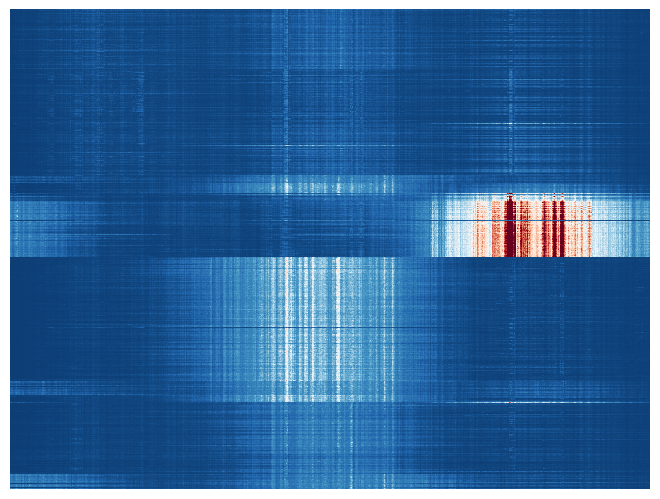

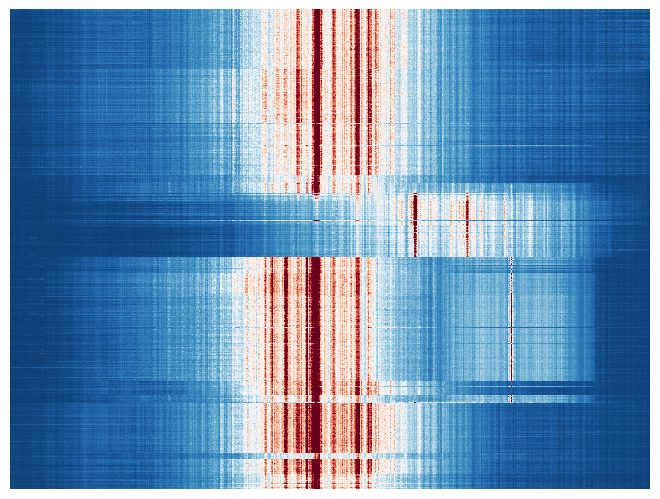

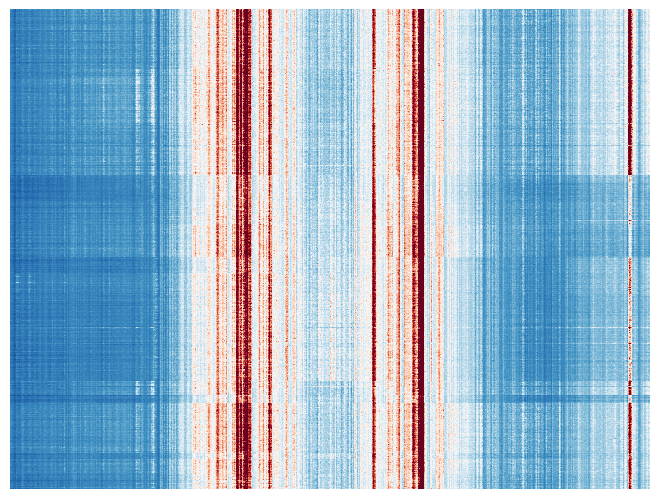

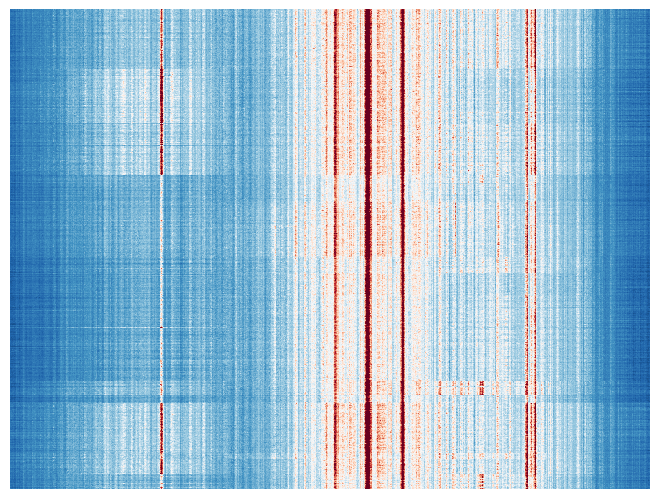

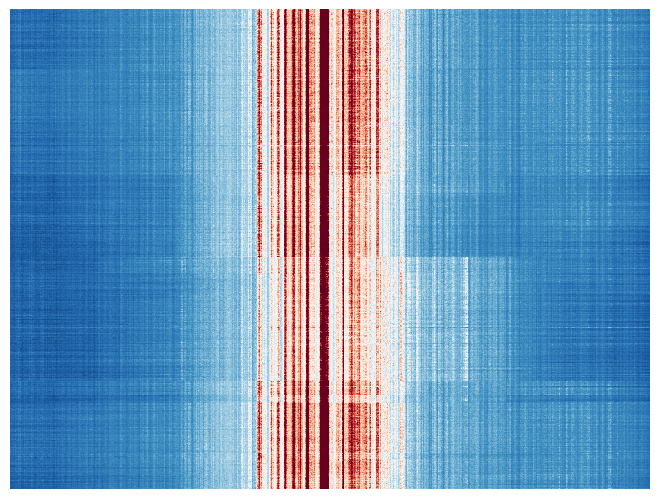

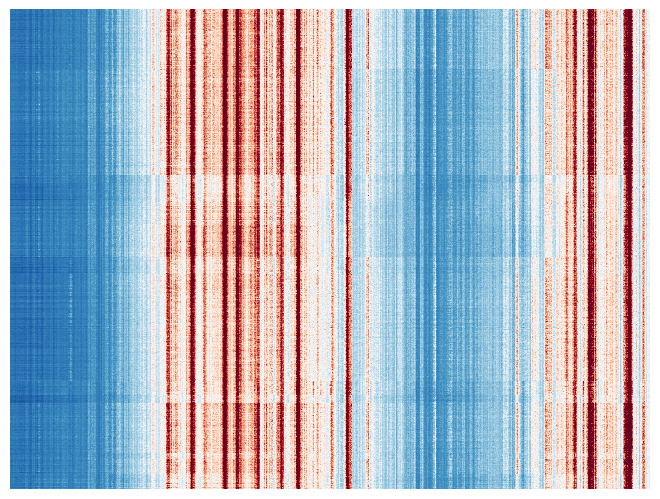

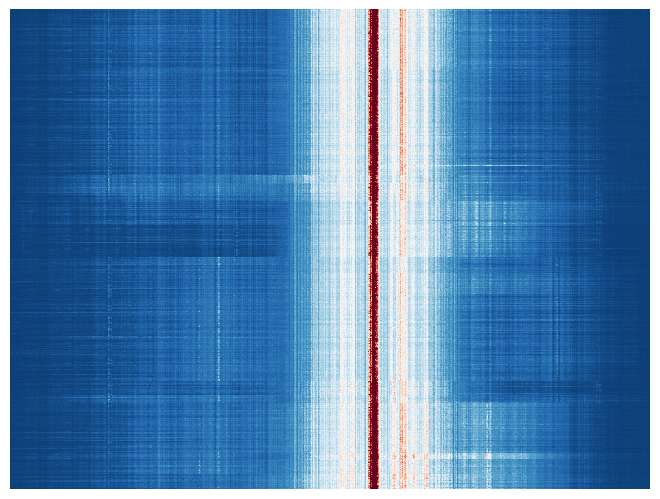

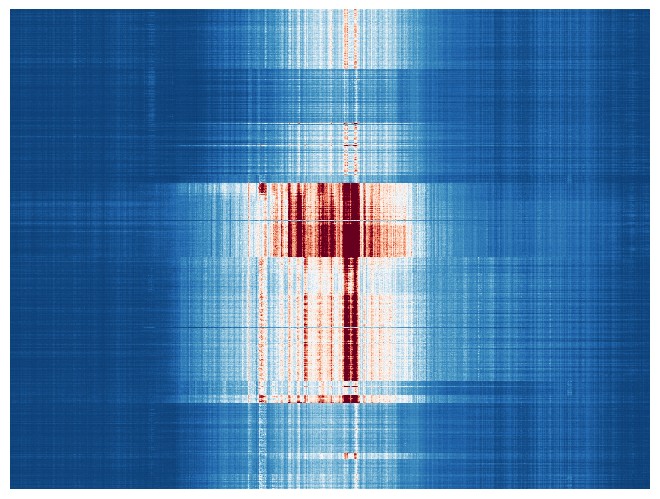

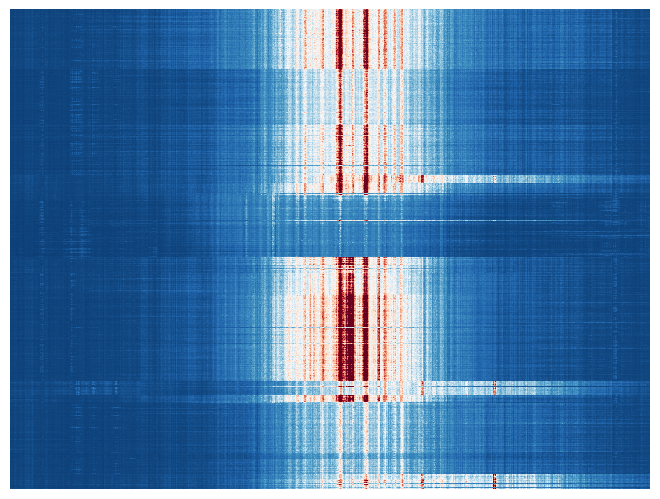

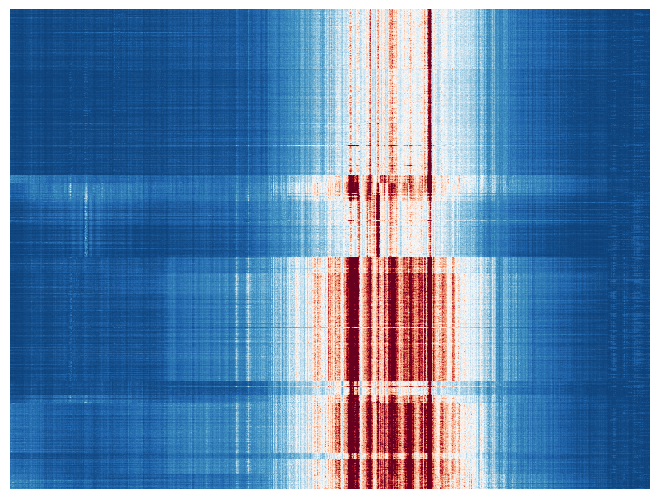

In [18]:
# reorder the pseudobulks by their cell type order
ids = [5,9,13,17,20,29,33,37,50,58,66,69,74,88,91,98,99,100,110,114,115,120,122,125,138,147,165,189,196,205,221,225,241,244,246,250,256,262,263,264,265,281,289,299,300,313,324,328,334,335,384,386,391,396,404,414,416,423,426,427,436,439,454,473,474,478,482,484,488,489,520,522,541,544,546,601,620,632,636,638,643,657,664,673,696,698,701,705,707,715,721,741,747,753,756,767,784,803,805,807,811,828,834,837,853,859,879,880,894,896,897,898,910,911,921,944,949,959,978,981,982,995,998,1000,1,10,14,19,26,32,71,75,179,180,181,186,193,194,198,200,206,208,211,224,230,232,239,242,247,252,259,260,261,270,275,282,292,297,298,304,305,323,325,326,327,333,337,338,342,345,355,365,374,375,380,381,395,405,410,413,420,465,476,493,510,511,517,529,538,542,543,552,567,586,593,599,602,615,644,652,658,666,669,686,702,710,713,714,719,726,727,744,745,748,750,765,771,778,792,821,833,841,848,849,865,867,882,885,893,902,932,935,939,942,954,955,962,965,966,975,976,8,12,15,23,35,40,46,57,65,70,82,85,86,89,101,113,140,149,154,176,183,199,214,222,237,238,251,257,268,277,303,309,310,361,363,368,377,389,400,401,415,417,425,438,442,451,459,466,471,472,494,496,502,504,508,514,518,528,564,592,600,624,651,660,663,671,693,711,720,725,732,734,735,736,758,781,783,799,822,830,840,854,862,864,872,875,889,912,919,920,945,951,952,958,969,970,972,977,979,980,986,991,992,999,330,344,366,398,429,462,483,628,665,694,708,737,780,794,824,866,947,144,430,540,699,112,162,435,441,530,587,746,800,953,18,168,388,437,453,532,582,856,956,129,226,294,308,434,503,560,588,596,625,728,768,782,838,878,16,22,44,45,54,56,60,81,84,93,126,130,134,139,142,156,170,192,201,204,217,253,269,352,354,392,394,445,452,455,464,467,576,581,607,681,704,706,723,739,751,766,806,835,863,871,892,895,901,923,924,946,4,42,59,63,109,111,141,143,184,197,209,213,231,283,302,306,316,343,358,360,372,383,403,408,440,447,460,469,533,548,555,570,583,585,595,606,610,611,618,637,662,684,697,700,718,761,777,789,808,810,816,818,839,845,850,876,899,906,913,929,974,985,987,996,997,30,34,64,97,124,171,190,218,279,329,443,461,485,575,594,621,646,692,733,738,770,773,801,829,831,836,844,860,881,883,886,904,909,933,973,2,41,53,73,96,105,128,161,175,178,210,271,320,322,359,367,406,458,463,470,479,506,513,523,561,566,603,634,635,648,674,688,755,787,827,842,858,873,927,937,943,3,6,21,31,39,43,47,48,51,52,68,76,80,90,103,106,107,116,137,148,150,151,153,158,160,173,182,185,188,202,203,207,212,220,223,229,236,240,243,248,255,266,272,274,276,280,284,285,286,288,291,295,312,314,315,317,318,331,332,339,340,348,353,356,357,362,364,369,376,378,379,397,402,411,412,418,422,432,450,457,475,481,487,492,498,501,507,516,519,521,526,531,545,550,553,554,559,562,563,568,574,590,591,597,605,608,613,614,616,619,626,627,629,639,641,649,650,659,667,668,670,672,676,679,683,685,689,695,703,709,717,722,724,729,740,742,743,752,754,757,759,762,769,774,775,788,795,797,802,804,817,819,820,823,826,846,847,852,855,861,868,870,877,884,891,900,905,915,917,918,922,931,936,938,948,960,964,967,968,971,984,993,49,67,78,79,87,159,187,191,219,346,419,468,480,490,578,598,630,642,654,682,716,764,772,790,812,815,874,930,934,940,94,102,131,155,301,321,524,551,558,832,961,990,350,534,760,925,7,11,24,28,38,61,83,92,95,117,118,119,127,132,133,146,152,157,163,164,166,167,172,174,195,216,227,233,245,249,254,267,273,278,287,296,307,336,341,347,349,351,370,371,385,390,393,407,409,424,428,431,444,449,456,477,491,495,497,499,500,505,509,515,527,537,539,571,572,577,579,580,584,612,617,623,631,633,645,653,655,656,677,690,712,730,749,763,779,785,786,791,798,813,843,851,857,887,888,908,926,928,957,963,983,989,77,108,136,145,293,311,421,525,556,565,622,691,25,36,62,121,123,169,177,228,234,235,290,373,382,387,446,448,569,589,604,640,647,661,675,678,776,796,809,869,903,950,27,55,72,104,135,215,258,319,399,433,486,512,535,536,547,549,557,573,609,680,687,731,793,814,825,890,907,914,916,941,988,994]
ids = np.array(ids) - 1
pred = vs
for key in list(vs.obsm.keys())[:10]:
    plt.figure()
    sns.heatmap(vs.obsm[key][ids], vmax=0.5, vmin=0.0, cmap='RdBu_r', cbar=False)
    plt.axis('off')
    plt.subplots_adjust(top = 1, bottom = 0, right = 1, left = 0, 
            hspace = 0, wspace = 0)
    plt.margins(0,0)

In [27]:
printer.close()

1000 pseudobulks are a lot. so we try to avoid genome wide or cCRE wide analysis, but focused on picking regions for analysis and visualization

## seq2PRINT reveals the TF binding dynamics for Erythroid development trajectory

We would "slice" the 150 ish pseudobulks that belong to the Erythroid development trajectories within those 1000 pseudobulks we just LoRA fintuned on, and further finetune them.

### Train the Ery-specific lora models

In [26]:
lora_models = ['BMMC_LoRA_fold0-honest-blaze-236.pt',
               'BMMC_LoRA_fold1-smooth-resonance-233.pt',
               'BMMC_LoRA_fold2-swift-darkness-237.pt',
               'BMMC_LoRA_fold3-glamorous-aardvark-234.pt',
               'BMMC_LoRA_fold4-faithful-field-235.pt'
              ]


In [27]:
temp_group = groupinfo.loc[(np.argmax(np.array(groupinfo.iloc[:, -4:]), axis=-1) == 1) & groupinfo['cellType'].isin(["HSC/MPP", "CMP", "MEP", "early-Ery", "late-Ery"])]
time = temp_group['Pseudotime']
Ery_group_names = temp_group['groupID']
Ery_group_names = list(np.array(Ery_group_names)[np.argsort(time)])
groupinfo.index = groupinfo['groupID']
barcodegroups_cluster = barcodegroups.groupby('group')
ery_bcs = [np.array(barcodegroups_cluster.get_group(g)['barcode']) for g in Ery_group_names]
ery_bcs = list(np.unique(ery_bcs))

In [114]:
# Use barcodes presented in Erythroid development trajectories, and call peaks
scp.pp.call_peaks(printer=printer, 
                  frag_file=frag,
                  cell_grouping=[ery_bcs], # here we call peaks on the cells that are included in the final analyses
                  group_names=['Ery_dev'], 
                  preset='seq2PRINT')

INFO  @ Mon, 19 Aug 2024 10:56:49: 
# Command line: callpeak --nomodel -t /data/rzhang/PRINT_rev/BMMC_tutorial/scprinter_supp/Ery_dev_filtered_frag.tsv.gz --outdir /data/rzhang/PRINT_rev/BMMC_tutorial/scprinter_supp/macs2 -n Ery_dev -f BEDPE --nolambda --keep-dup all --call-summits --nomodel -B --SPMR --shift 75 --extsize 150 -p 0.01
# ARGUMENTS LIST:
# name = Ery_dev
# format = BEDPE
# ChIP-seq file = ['/data/rzhang/PRINT_rev/BMMC_tutorial/scprinter_supp/Ery_dev_filtered_frag.tsv.gz']
# control file = None
# effective genome size = 2.70e+09
# band width = 300
# model fold = [5, 50]
# pvalue cutoff = 1.00e-02
# qvalue will not be calculated and reported as -1 in the final output.
# The maximum gap between significant sites is assigned as the read length/tag size.
# The minimum length of peaks is assigned as the predicted fragment length "d".
# Larger dataset will be scaled towards smaller dataset.
# Range for calculating regional lambda is: 10000 bps
# Broad region calling is off
# Pai

Reading in peak summit file(s):
NOTE: Assuming all start coordinates are 0-based ..

Padding peak summits by: 500 bp on either side for
Removing peaks overlapping with blacklisted regions and out of bound peaks based on chromosome sizes ..

Filtering overlapping peaks based on peak summit score ..
round: 1 297680 peaks unresolved 296327 peaks selected
round: 2 33 peaks unresolved 33 peaks selected
finish clearing
finish sorting
finished summary


In [153]:
# fetched the cleaned peaks, save, it will be used in the next step
cleaned_peaks = pd.DataFrame(printer.uns["peak_calling"]['Ery_dev_cleaned'][:])
cleaned_peaks.to_csv(f'{work_dir}/seq2print_cleaned_narrowPeak_Ery_dev.bed', 
                     sep='\t', header=False, index=False)

cleaned_peaks

,0,1,2,3,4,5,6,7
0,chr1,816833,817833,Ery_dev_peak_8,75.9214,75.9214,Ery_dev,48479
1,chr1,820912,821912,Ery_dev_peak_9,2.84392,2.84392,Ery_dev,258078
2,chr1,827022,828022,Ery_dev_peak_10,1381.6,1381.6,Ery_dev,7341
3,chr1,828840,829840,Ery_dev_peak_11a,27.238,27.238,Ery_dev,83052
4,chr1,829237,830237,Ery_dev_peak_11b,11.7093,11.7093,Ery_dev,126347
...,...,...,...,...,...,...,...,...
296355,chrX,155640983,155641983,Ery_dev_peak_147496,2.01487,2.01487,Ery_dev,291474
296356,chrX,155650878,155651878,Ery_dev_peak_147497,4.14397,4.14397,Ery_dev,216081
296357,chrX,155661992,155662992,Ery_dev_peak_147498,6.46679,6.46679,Ery_dev,173723
296358,chrX,155666488,155667488,Ery_dev_peak_147499,4.50136,4.50136,Ery_dev,210717


In [28]:
lora_slice_configs = []
for fold, model in enumerate(lora_models):
    lora_slice_config = scp.tl.seq_lora_slice_model_config(
                                            region_path=f'{work_dir}/seq2print_cleaned_narrowPeak_Ery_dev.bed', 
                                            lora_config=f'{work_dir}/configs/BMMC_lora_fold{fold}.JSON',
                                            pretrained_lora_model=f'{work_dir}/model/{model}',
                                            model_name=f'BMMC_Ery_LoRA',
                                            finetune_group_names=Ery_group_names,
                                            fold=fold,
                                            additional_lora_config={
                                            "lr":3e-4, # put smaller lr for further fintune
                                            "notes": "v3",
                                            "tags": ["BMMC",
                                                     "Ery",
                                                     "LoRA",
                                                f"fold{fold}"]},  
                                            path_swap=(work_dir, ''),
                                            config_save_path=f'{work_dir}/configs/Ery_lora_fold{fold}.JSON')
    lora_slice_configs.append(lora_slice_config)

In [29]:
for fold in range(5):
    scp.tl.launch_seq2print(model_config_path=f'{work_dir}/configs/Ery_lora_fold{fold}.JSON',
                            temp_dir='../PRINT_rev/BMMC_tutorial/temp',
                            model_dir='../PRINT_rev/BMMC_tutorial/model',
                            data_dir='../PRINT_rev/BMMC_tutorial',
                            gpus=fold,
                            wandb_project='scPrinter_seq_tutorial', verbose=True, launch=False)

Please copy the following command in your terminal and run it to start the job
CUDA_VISIBLE_DEVICES=0 seq2print_train --config /data/rzhang/PRINT_rev/BMMC_tutorial/configs/Ery_lora_fold0.JSON --temp_dir ../PRINT_rev/BMMC_tutorial/temp --model_dir ../PRINT_rev/BMMC_tutorial/model --data_dir ../PRINT_rev/BMMC_tutorial --project scPrinter_seq_tutorial --enable_wandb
Please copy the following command in your terminal and run it to start the job
CUDA_VISIBLE_DEVICES=1 seq2print_train --config /data/rzhang/PRINT_rev/BMMC_tutorial/configs/Ery_lora_fold1.JSON --temp_dir ../PRINT_rev/BMMC_tutorial/temp --model_dir ../PRINT_rev/BMMC_tutorial/model --data_dir ../PRINT_rev/BMMC_tutorial --project scPrinter_seq_tutorial --enable_wandb
Please copy the following command in your terminal and run it to start the job
CUDA_VISIBLE_DEVICES=2 seq2print_train --config /data/rzhang/PRINT_rev/BMMC_tutorial/configs/Ery_lora_fold2.JSON --temp_dir ../PRINT_rev/BMMC_tutorial/temp --model_dir ../PRINT_rev/BMMC_tut

### Quick inspection

Visualize the observed footprints and predicted one. We can also get the TFBS scores in some example regions

In [102]:
Ery_lora_models = ['BMMC_Ery_LoRA_fold0-lunar-snowflake-241.pt',
                  'BMMC_Ery_LoRA_fold1-genial-bush-238.pt',
                  'BMMC_Ery_LoRA_fold2-autumn-rain-238.pt',
                  'BMMC_Ery_LoRA_fold3-glowing-vortex-238.pt',
                  'BMMC_Ery_LoRA_fold4-youthful-grass-242.pt']
temp_group = groupinfo.loc[(np.argmax(np.array(groupinfo.iloc[:, -4:]), axis=-1) == 1) & groupinfo['cellType'].isin(["HSC/MPP", "CMP", "MEP", "early-Ery", "late-Ery"])]
time = temp_group['Pseudotime']
Ery_group_names = temp_group['groupID']
Ery_group_names = list(np.array(Ery_group_names)[np.argsort(time)])
barcodegroup_grouped = barcodegroups.groupby('group')
Ery_cell_grouping = [list(barcodegroup_grouped.get_group(x)['barcode']) for x in tqdm(Ery_group_names)]

  0%|          | 0/135 [00:00<?, ?it/s]

get the observed footprints

In [106]:
scp.tl.get_footprint_score(printer,
                       save_key='test_region',
                       cell_grouping=Ery_cell_grouping,
                       group_names=Ery_group_names, 
                       regions = ["chr11:5284262-5285262"], backed=True, overwrite=True)

estimated file size: 0.05 GB
Creating test_region in printer.footprintsadata
obs=groups, var=regions
118 100
Loading insertion profiles


Submitting jobs:   0%|          | 0/99 [00:00<?, ?it/s]

collecting multi-scale footprints:   0%|          | 0/99 [00:00<?, ?it/s]

<Axes: >

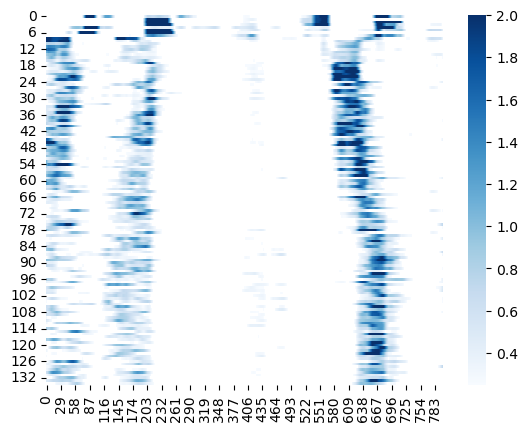

In [107]:
footprint_adata = printer.footprintsadata['test_region']
footprints = footprint_adata.obsm["chr11:5284262-5285262"]
fp = footprints[:, 48, 100:-100].copy()
fp[fp <= 0.25] = np.nan
sns.heatmap(fp, cmap='Blues', vmin=0.25, vmax=2.0)

now the model predicted ones

In [108]:
chr = 'chr11'
start = 5284262
end = 5285262

center = (start + end) // 2
pad = 1840 // 2
start = center-pad
end = center+pad
seq = scp.genome.hg38.fetch_onehot_seq(chr, 
                               center-pad, 
                               center+pad)[None]
seq.shape

torch.Size([1, 4, 1840])

In [109]:
models = [torch.load(os.path.join(work_dir, 'model', path),
                     map_location='cpu', weights_only=False) for path in Ery_lora_models]
for model in models:
    model.eval()
    # Set coverage to be the same
    mm =  model.coverages.weight.data[:, -1].mean()
    model.coverages.weight.data[:, -1] = mm


In [110]:
footprints_avg = []
baseline_avg = []
counts_avg = []
for model in models:
    model_ori = model.return_origin()
    model = model.cuda()
    model_ori = model_ori.cuda()
    footprints = []
    baseline = []
    counts = []
    with torch.no_grad():
        # for i in tqdm(order):
        for i in trange(len(Ery_cell_grouping)):
            pred_ori = model(seq.cuda().float(), torch.as_tensor([i]).long().cuda())
            model_0 = model.collapse(int(i))
            model_0 = model_0.cuda()
            model_0.eval()
            pred = model_0(seq.cuda().float(), cells=torch.as_tensor([i]).long().cuda())
            # print (pred_ori[1] - pred[1])
            footprints.append(pred[0][0].detach().cpu().numpy())
            counts.append(pred[1].detach().cpu().numpy())
            # model.dna_cnn_model.conv.scale = 0.0
            pred = model_ori(seq.cuda().float())
            baseline.append(pred[0][0].detach().cpu().numpy())
    footprints = np.array(footprints)
    baseline = np.array(baseline)
    counts = np.array(counts).reshape((-1))
    footprints_avg.append(footprints)
    baseline_avg.append(baseline)
    counts_avg.append(counts)
    model = model.cpu()
    model_ori = model_ori.cpu()
    break
footprints_avg = np.array(footprints_avg)
baseline_avg = np.array(baseline_avg)
counts_avg = np.array(counts_avg)

  0%|          | 0/135 [00:00<?, ?it/s]

model predicted nucleosome-scale footprints

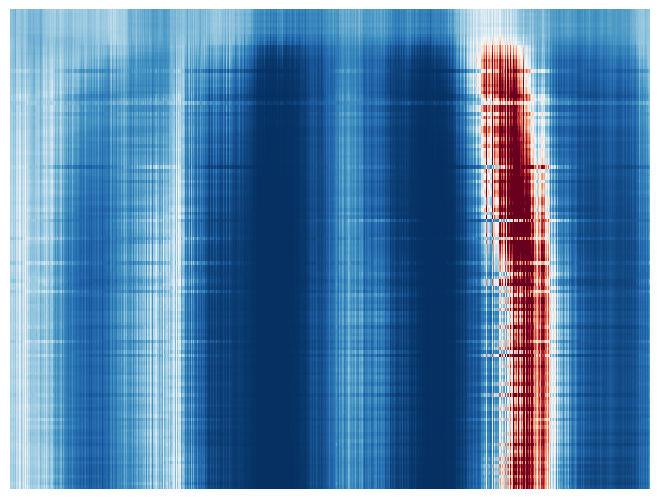

In [111]:
xx = scp.utils.zscore2pval(footprints_avg.mean(axis=0))  #-  scp.utils.zscore2pval(baseline)
sns.heatmap(xx[:, 50, :], cmap='RdBu_r',cbar=False, vmax=0.75)
plt.axis('off')
plt.subplots_adjust(left=0, bottom=0, right=1, top=1)
# plt.savefig('pred_lora_peak.png')

now let's calculate and visualize the sequence based TF binding score in this region

In [113]:
regions = scp.utils.regionparser(["chr11:5284262-5285262"])
regions.to_csv(f'{work_dir}/example_ery_region1.bed', sep='\t', header=False, index=False)

In [ ]:
import json
adata_ery_tfbs = scp.tl.seq_tfbs_seq2print(seq_attr_count=None,
                          seq_attr_footprint=None,
                          genome=printer.genome,
                          region_path=f'{work_dir}/example_ery_region1.bed',
                          gpus=[0,1,2,3],
                          model_type='lora',
                          model_path=[os.path.join(work_dir, 'model', m) for m in Ery_lora_models],
                          lora_config=json.load(open(f'{work_dir}/configs/Ery_lora_fold0.JSON', 'r')),
                          group_names=Ery_group_names,
                          verbose=False,
                          launch=True,
                          return_adata=True, # turn this as True
                          overwrite_seqattr=False,
                          save_key='BMMC_Ery_lora_example_ery_region1', # and input a save_key 
                          save_path=work_dir)

In [115]:
tfbs = adata_ery_tfbs.obsm['chr11:5284362-5285162']

<Axes: >

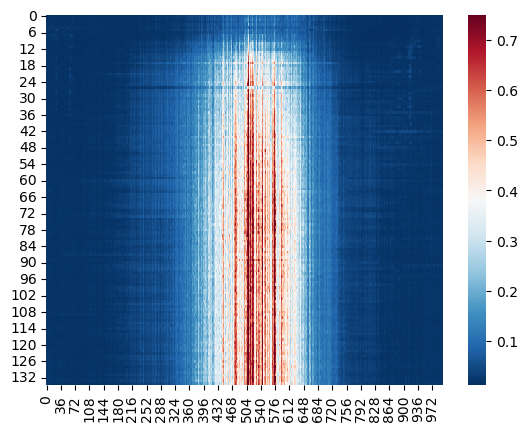

In [121]:
sns.heatmap(tfbs, cmap='RdBu_r', vmax=0.75)

### Global analysis on this trajectory

First create sequence attribution scores CRE-wide for those pseudobulks

In [ ]:
from tqdm.auto import *
import pyBigWig
from tqdm.contrib.concurrent import *
import pyranges
import bioframe

In [ ]:
scp.tl.seq_tfbs_seq2print(seq_attr_count=None,
                          seq_attr_footprint=None,
                          genome=scp.genome.hg38,
                          region_path=f'{work_dir}/eryCREs.bed',
                          gpus=[0,1,2,3,4,5,6,7],
                          model_type='lora',
                          model_path=[os.path.join(work_dir, 'model', m) for m in Ery_lora_models ],
                          lora_config=json.load(open(f'{work_dir}/configs/Ery_lora_fold0.JSON', 'r')),
                          group_names=Ery_group_names,
                          verbose=True,
                          launch=False,
                          return_adata=False, # turn this as True
                          post_normalize=True, # turn on this to further control coverage bias, works well when having a lot of regions (>2k)
                          overwrite_seqattr=False,
                          save_key='ery_TFBS', # and input a save_key 
                          save_path=f'{work_dir}/ery_TFBS')

In [73]:

def process_cell(name, verbose=False):
    bw_dir = f'{work_dir}/ery_TFBS'
    v_cell = []
    with pyBigWig.open(os.path.join(bw_dir, f'{name}TFBS.bigwig'), 'r') as f:
        for chr,start,end in zip(tqdm(erypeak['chrom'], disable=not verbose), erypeak['start'], erypeak['end']):
            center = (start + end) // 2
            # v = f.values(chr, center, center+1, numpy=True)[0]
            v = f.values(chr, start+100, end-100, numpy=True)
            if np.sum(np.isnan(v)) > 0:
                print (chr, start, end, name)
            v_cell.append(v)
    return np.array(v_cell)
erypeak = pd.read_csv(f'{work_dir}/eryCREs.bed', sep='\t', header=None)
erypeak.columns = ['chrom','start','end']

# Fetch TF binding score for all Ery cCREs.
tfbs = np.array(process_map(process_cell, Ery_group_names, max_workers=150))
tfbs_10bp = []
for i in range(80):
    tfbs_10bp.append(tfbs[:, :, i*10:i*10+10].mean(axis=-1))
tfbs_10bp = np.stack(tfbs_10bp, axis=-1)
tfbs_10bp = res.reshape((res.shape[0], -1))

,chrom,start,end
0,chr1,9836,10836
1,chr1,28860,29860
2,chr1,778235,779235
3,chr1,816838,817838
4,chr1,827024,828024
...,...,...,...
20237,chrX,154819598,154820598
20238,chrX,154827267,154828267
20239,chrX,154840553,154841553
20240,chrX,155332362,155333362


In [78]:
# Now create the tiled 10bp bed dataframe
erypeak = pd.read_csv(f'{work_dir}/eryCREs.bed', sep='\t', header=None)
erypeak.columns = ['chrom','start','end']
erypeak = scp.utils.resize_bed_df(erypeak, 800)

In [79]:
erypeak.columns = ['Chromosome','Start','End']
tile_10bp = pyranges.PyRanges(erypeak).window(10).df
tile_10bp.columns = ['chrom','start','end']
tile_10bp['index3'] = np.arange(len(tile_10bp))
erypeak.columns = ['chrom','start','end',]

In [80]:
CREs = pd.read_csv(peak, sep='\t', header=None)
CREs[1] -= 1
CREs.columns = ['chrom','start','end']
ov_tile_10bp2peak = bioframe.overlap(tile_10bp, CREs)
# Remove sites overlapping with more than one CREs
non_overlap = ov_tile_10bp2peak['index3'].drop_duplicates(keep=False)
filter0 = np.zeros((len(temp)))
filter0[non_overlap.values] = 1
filter0 = filter0.astype('bool')
np.sum(filter0)


,chrom,start,end
0,chr1,9836,10836
1,chr1,28860,29860
2,chr1,181070,182070
3,chr1,191078,192078
4,chr1,267519,268519
...,...,...,...
189254,chrX,155577367,155578367
189255,chrX,155611181,155612181
189256,chrX,155612352,155613352
189257,chrX,155632170,155633170


1619360


1612804

In [82]:
import anndata
adata = anndata.read_h5ad('/data/rzhang/PRINT_rev/BMMC/Ery_peak_norm_old.h5ad')

/home/rzhang/miniforge3/envs/seq2print/lib/python3.11/site-packages/anndata/_core/aligned_df.py:67: ImplicitModificationWarning: Transforming to str index.


In [83]:
from scipy.stats import *
CREs = pd.read_csv("/data/rzhang/PRINT_rev/BMMC/regions.bed", sep='\t', header=None)
CREs[1] -= 1
CREs.columns = ['chrom','start','end']
CREs
CREs['index2'] = np.arange(len(CREs))
ov_peak_all = bioframe.overlap(temp, CREs)
ov_peak_all = ov_peak_all.drop_duplicates(['index3'])
seq_model_cre = adata.X.toarray()[:, ov_peak_all['index2_']].T
print (seq_model_cre.shape)
def process_corr(xx):
    return pearsonr(xx, np.arange(len(xx)))[0]
seq_corr = process_map(process_corr, seq_model_cre, max_workers=128, chunksize=100)
seq_corr = np.array(seq_corr)

(1619360, 135)


  0%|          | 0/1619360 [00:00<?, ?it/s]

In [84]:
from tqdm.contrib.concurrent import *
import scipy
def process_pearsonr(y):
    return scipy.stats.spearmanr(y, np.arange(len(Ery_group_names)))[0]
filter1_seq = np.nanmax(res, axis=0) # remove low signal sites
filter2_seq = np.array(process_map(process_pearsonr, res.T, max_workers=100, chunksize=1000))

  0%|          | 0/1619360 [00:00<?, ?it/s]

In [85]:
filter_all = filter0 & (filter1_seq > 0.02)  & (seq_corr > 0.75) & (filter2_seq > 0)
print(np.sum(filter_all), np.sum(filter1_seq > 0.02), np.sum(filter2_seq > 0), np.sum(seq_corr > 0.75))
temp_pass = temp.loc[filter_all]
v1 = res[:, filter_all]
print (temp_pass)

194629 1605024 808389 261325
        chrom      start        end   index3
160      chr1     778335     778345      160
161      chr1     778345     778355      161
162      chr1     778355     778365      162
163      chr1     778365     778375      163
164      chr1     778375     778385      164
...       ...        ...        ...      ...
1619345  chrX  155335032  155335042  1619345
1619346  chrX  155335042  155335052  1619346
1619347  chrX  155335052  155335062  1619347
1619348  chrX  155335062  155335072  1619348
1619349  chrX  155335072  155335082  1619349

[194629 rows x 4 columns]


In [86]:
CREs['index2'] = np.arange(len(CREs))

In [87]:
ov_peak = bioframe.overlap(temp_pass, CREs)
ov_peak

,chrom,start,end,index3,chrom_,start_,end_,index2_
0,chr1,778335,778345,160,chr1,778235,779235,5
1,chr1,778345,778355,161,chr1,778235,779235,5
2,chr1,778355,778365,162,chr1,778235,779235,5
3,chr1,778365,778375,163,chr1,778235,779235,5
4,chr1,778375,778385,164,chr1,778235,779235,5
...,...,...,...,...,...,...,...,...
194624,chrX,155335032,155335042,1619345,chrX,155334282,155335282,189252
194625,chrX,155335042,155335052,1619346,chrX,155334282,155335282,189252
194626,chrX,155335052,155335062,1619347,chrX,155334282,155335282,189252
194627,chrX,155335062,155335072,1619348,chrX,155334282,155335282,189252


In [88]:
ov_peak.drop_duplicates(['index2_'])[['chrom_','start_','end_']]#.to_csv('/data/rzhang/PRINT_rev/BMMC/final_Ery_regions.bed', sep='\t', header=False, index=False)

,chrom_,start_,end_
0,chr1,778235,779235
75,chr1,827024,828024
145,chr1,828855,829855
200,chr1,842492,843492
260,chr1,869413,870413
...,...,...,...
194357,chrX,154762257,154763257
194437,chrX,154798810,154799810
194482,chrX,154801550,154802550
194503,chrX,154805013,154806013


In [89]:
rna = pd.read_csv("/data/rzhang/PRINT_rev/BMMC/Ery_gene_exp.tsv", index_col=0, sep='\t')
tss = pd.read_csv("/data/rzhang/PRINT_rev/BMMC/Ery_gene_TSS.tsv", sep='\t')
# tss.index = tss['gene_name']
tss.columns = ['chrom','start','end'] + list(tss.columns)[3:]

In [90]:
tss = scp.utils.resize_bed_df(tss, 100000)
tss

,chrom,start,end,width,strand,transcript_id,gene_name
0,chr1,777591,877591,1,+,NR_047526.1,LINC01128
1,chr1,3574992,3674992,1,+,NM_182752.3,TPRG1L
2,chr1,6374776,6474776,1,+,XM_011542237.1,ESPN
3,chr1,6563696,6663696,1,+,NM_153812.2,PHF13
4,chr1,11930181,12030181,1,+,NM_001127660.1,MFN2
...,...,...,...,...,...,...,...
1460,chrY,4950044,5050044,1,+,XM_017030080.1,PCDH11Y
1461,chrY,14472578,14572578,1,+,XM_011531426.2,NLGN4Y
1462,chrY,20706068,20806068,1,+,NM_001039567.2,RPS4Y2
1463,chrY,19694940,19794940,1,-,NM_001146705.1,KDM5D


In [91]:
def rz_conv(a, n=2):
    if n == 0:
        return a
    # a can be shape of (batch, sample,...,  x) and x will be the dim to be conv on
    # pad first:
    shapes = np.array(a.shape)
    shapes[-1] = n
    a = np.concatenate([np.zeros(shapes) * a[...,0][..., None], a, np.zeros(shapes) * a[...,-1][..., None]], axis=-1)
    ret = np.nancumsum(a, axis=-1)
    # ret[..., n * 2:] = ret[..., n * 2:] - ret[..., :-n * 2]
    # ret = ret[..., n * 2:]
    ret =  ret[..., n * 2:] - ret[..., :-n * 2]
    return ret

def processTrack(x, smooth=5):
    x = rz_conv(x, n=smooth) / (2 * smooth)
    x = x[..., smooth:x.shape[-1]-smooth]
    x = (x - np.min(x, axis=-1, keepdims=True)) / (np.max(x, axis=-1, keepdims=True) - np.min(x, axis=-1, keepdims=True))
    return x

# barcode_grp = barcode_grp[new_order]
def fetch_one(region):
    i, region = region
    atac_all = insertion[region['chrom']][:, int(region['start']):int(region['end'])]
    atac = np.array([np.asarray(atac_all[barcodes].sum(axis=0)).astype('float32')[0] for barcodes in barcode_grp]).sum(axis=-1)
    return atac
# all1 = []
# all1 = process_map(fetch_one, CREs.iterrows(), max_workers=100)
# all1 = np.array(all1)
# all1.shape


In [92]:
select = ov_peak['index2_']
select = np.array(select)

In [93]:
# # Now for TFs
peak = pd.read_csv("/data/rzhang/PRINT_rev/BMMC/eryCREs.bed", sep='\t', header=None)
# peak = peak.drop_duplicates()
peak.columns = ['chrom','start','end']
gc, freq = scp.utils.get_peak_bias(peak, scp.genome.hg38)
motifs = scp.motifs.Motifs("./human_pfms_v4.txt",
                           scp.genome.hg38.fetch_fa(),
                           bg = tuple(freq),
                           n_jobs=32,pvalue=5e-5,
                           mode='motifmatchr'
                          )
motifs.prep_scanner(tf_genes=None,pvalue=5e-5)
motif_res = motifs.scan_motif(np.array(peak), verbose=True)
motif_res = pd.DataFrame(motif_res)
motif_res['chrom'] = motif_res[0]
motif_res['start'] = motif_res[1] + motif_res[7]
motif_res['end'] = motif_res[1] + motif_res[8]
motif_res['TF'] = [xx.split("_")[2] for xx in motif_res[4]]
motif_backup = motif_res.copy()

motif_match = motif_backup
motif_match = motif_match[['chrom','start','end','TF']]
temp_pass['index3'] = np.arange(len(temp_pass))
motif_match = bioframe.overlap(motif_match, temp_pass)
motif_match = motif_match[~motif_match['chrom_'].isna()]

/tmp/ipykernel_826436/974659561.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [94]:
motif_score = v1[:,motif_match['index3_'].astype('int')]
motif_score.shape

(135, 2588689)

In [95]:
yy = processTrack(adata.X.toarray()[:, select].T, 10).mean(axis=0)
yy = (yy - np.min(yy)) / (np.max(yy) - np.min(yy))
yy_accessibility = np.copy(yy)

In [96]:
all_sig = [yy_accessibility]
all_xx = [np.arange(len(yy))]
all_tfs = ['accessibility'] * len(yy)
# for tf in [["GATA1", "GATA2", "TAL1"], ["NFE2", "NFE2L2"], ["E2F4"], 
#            ["IRF2"], ["CUX1"],["JUN"], ["TCF3"], ["SMAD9"], ["ESR2"], 
#            ["KLF1"], ["RELA"], ["SP1"], ["USF2"]]:
for tf in [['GATA1', 'GATA2'], ["NFE2", "NFE2L2"],['TAL1'], ['NR2F1'],
          ['JUN', 'FOS','JUND'],['KLF1']]:
    mask = np.array(motif_match['TF'].isin(tf))
    if np.sum(mask) <= 100:
        continue
    yy = motif_score[:, mask]
    yy = processTrack(yy.T, 10).mean(axis=0)
    yy = (yy - np.min(yy)) / (np.max(yy) - np.min(yy))
    all_sig.append(yy)
    all_xx.append(np.arange(len(yy)))
    all_tfs += [','.join(tf)] * len(yy)
all_sig = np.concatenate(all_sig)
all_xx = np.concatenate(all_xx)

(0.0, 1.0)

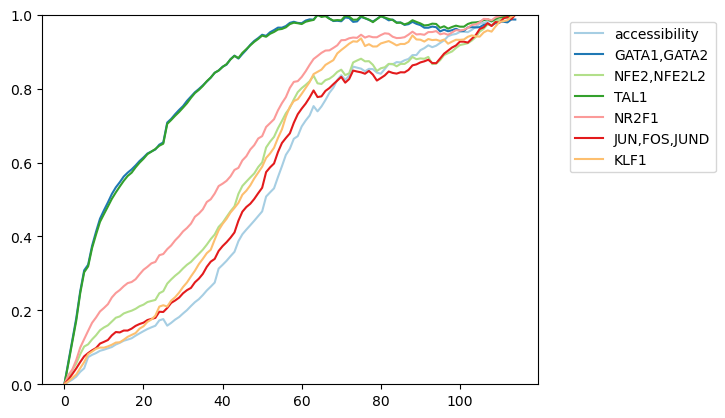

In [97]:
ax=sns.lineplot(x=all_xx, y=all_sig, hue=all_tfs, palette='Paired')

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
ax.set_ylim(0.0, 1.0)

In [98]:
def lag_computation(tf):
    mask = np.array(motif_match['TF'] == tf)
    if np.sum(mask) <= 100:
        return [np.nan, np.nan, np.nan]
    yy = motif_score[:, mask]
    yy = processTrack(yy.T, 10).mean(axis=0)
    # yy = (yy - np.min(yy)) / (np.max(yy) - np.min(yy))
    # tfscore = np.mean(yy)
    tfscore = np.trapz(yy, np.arange(len(yy))) / len(yy)
    
    motif_local = motif_match.loc[mask][['chrom','start','end']]
    motif2CRE = bioframe.overlap(motif_local, CREs)
    select = np.array(motif2CRE['index2_']).astype('int')
    yy = processTrack(adata.X.toarray()[:, select].T, 10).mean(axis=0)
    # yy = (yy - np.min(yy)) / (np.max(yy) - np.min(yy))
    # atacscore = np.mean(yy)
    atacscore = np.trapz(yy, np.arange(len(yy)))  / len(yy)
    
    
    motif2tss = bioframe.overlap(motif_local, tss)
    motif2tss = motif2tss[~motif2tss['gene_name_'].isna()]
    select = np.array(motif2tss['gene_name_'])
    yy = processTrack(np.array(rna.loc[select]), 10).mean(axis=0)
    # yy = (yy - np.min(yy)) / (np.max(yy) - np.min(yy))
    # rnascore = np.mean(yy)
    rnascore = np.trapz(yy, np.arange(len(yy)))  / len(yy)
    crelag = tfscore - atacscore
    rnalag = tfscore - rnascore
    motifcenter = (motif2CRE['start'] + motif2CRE['end']) // 2
    crecenter = (motif2CRE['start_'] + motif2CRE['end_']) // 2
    distance = np.mean(np.abs(motifcenter - crecenter))
    return [crelag, rnalag, distance]

In [99]:
CREs = pd.read_csv("/data/rzhang/PRINT_rev/BMMC/regions.bed", sep='\t', header=None)
CREs.columns = ['chrom','start','end']
CREs['index2'] = np.arange(len(CREs))
tfs = motif_match['TF'].unique()
lag_res = process_map(lag_computation, tfs, max_workers=128, chunksize=10)
lag_res = np.array(lag_res)
mask = ~np.isnan(np.sum(lag_res, axis=-1))
tfs = np.array(tfs)[mask]
lag_res = lag_res[mask]
lag_res = pd.DataFrame(lag_res, columns=['cre-lag','rna-lag','distance'])
lag_res['TF'] = tfs

  0%|          | 0/1141 [00:00<?, ?it/s]

In [100]:
print(spearmanr(lag_res['cre-lag'], lag_res['distance']))
print(spearmanr(lag_res['rna-lag'], lag_res['distance']))

SignificanceResult(statistic=-0.4673608464639141, pvalue=1.5361514943441745e-59)
SignificanceResult(statistic=-0.17406825233826717, pvalue=8.933241955857871e-09)


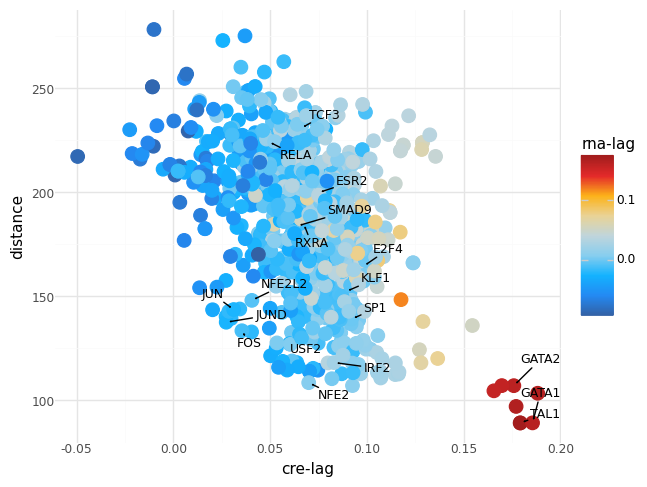

In [101]:
import pandas as pd
from plotnine import *
from adjustText import *
labelTFs = ["GATA1", "GATA2", "TAL1", "NFE2L2", "RXRA", "NFE2", "E2F4", "IRF2", "CUX1",
              "JUN","JUND", "FOS", "FOSL", "TCF3", "SMAD9", "ESR2", "KLF1", "RELA", "SP1", "USF2"]
colors = ['blue', 'red']

# Points that need labels
label_data = lag_res[lag_res['TF'].isin(labelTFs)].copy()
# label_data = lag_res.copy()
# Add a small offset for label positioning
label_data['xend'] = label_data['cre-lag'] #+ 0.03 * np.random.randn(len(label_data))
label_data['yend'] = label_data['distance'] #+ 5 * np.random.randn(len(label_data))


# Create a ggplot2 style scatter plot
plot = (ggplot(lag_res, aes(x='cre-lag', y='distance', color='rna-lag', label='TF')) + 
geom_point(size=5) +  # Adjust point size as needed
scale_color_gradientn(colors=["#3361A5",
        "#248AF3",
        "#14B3FF",
        "#88CEEF",
        "#C1D5DC",
        "#EAD397",
        "#FDB31A",
        "#E42A2A",
        "#A31D1D"], limits=[lag_res['rna-lag'].min(), lag_res['rna-lag'].max()]) +
    # geom_text(aes(x='xend', y='yend', label='TF'), 
    #           data=label_data, format_string='', 
    #           ha='center', va='center', color='black') +
    # geom_segment(aes(xend='xend', yend='yend', x='cre-lag', y='distance'), data=label_data, 
    #              inherit_aes=False, color='black',
    #             linetype='solid',  # Solid line
    #              size=0.5) +  # Adjust line thickness as needed) +  # Drawing connectors
    theme_minimal() +
    theme(legend_position='right'))  # Positioning the legend
# fig.save('/data/rzhang/PRINT_rev/BMMC/Ery_scatterplot_reproduce2.pdf', height=5, width=6)
# Draw the plot and get the figure and axis objects
fig = plot.draw()
ax = fig.axes[0]

# Use adjustText to adjust the text labels
texts = []
for i, row in lag_res[lag_res['TF'].isin(labelTFs)].iterrows():
    texts.append(ax.text(row['cre-lag'], row['distance'], row['TF'], fontsize=9))

adjust_text(texts, expand=(2,2), arrowprops=dict(arrowstyle='->', color='black'), ax=ax)
fig

In [71]:
printer.close()